# Realistic, Simulated Bayesian Marketing Mix

## Results

See `readme.md` for a brief high-level intro. Here, I'll summarize results.

# TODO

In [130]:
import numpy as np
import pandas as pd
import scipy as sp
import matplotlib.pyplot as plt
import seaborn as sns

# note I'm running the bleeding edge PyMC dev version, which will continue to evolve.
import pymc3 as pm
import bambi as bmb
import arviz as az
from IPython.core.interactiveshell import InteractiveShell


InteractiveShell.ast_node_interactivity = "all"
pd.set_option("display.max_columns", 200)

az.style.use("arviz-darkgrid")

rc = {
    "plot.max_subplots": 80,
}
az.rcParams.update(rc)

In [2]:
!conda list

# may also try pm bleeding edge
# import pymc as pm4

%load_ext lab_black

# packages in environment at /home/jan/miniconda3/envs/2021-11:
#
# Name                    Version                   Build  Channel
_libgcc_mutex             0.1                 conda_forge    conda-forge
_openmp_mutex             4.5                      1_llvm    conda-forge
aeppl                     0.0.14                   pypi_0    pypi
alsa-lib                  1.2.3                h516909a_0    conda-forge
anyio                     3.4.0            py39hf3d152e_0    conda-forge
argon2-cffi               21.1.0           py39h3811e60_2    conda-forge
arviz                     0.11.4             pyhd8ed1ab_0    conda-forge
async_generator           1.10                       py_0    conda-forge
atk-1.0                   2.36.0               h3371d22_4    conda-forge
attrs                     21.2.0             pyhd8ed1ab_0    conda-forge
babel                     2.9.1              pyh44b312d_0    conda-forge
backcall                  0.2.0              pyh9f0ad1d_0    conda-forg

## Data Simulation

_TODO_: there are no true confounds below (affect outcome and treatment). would be cool to add e.g. "macro," which would affect both demand/CPA _and_ spend.  

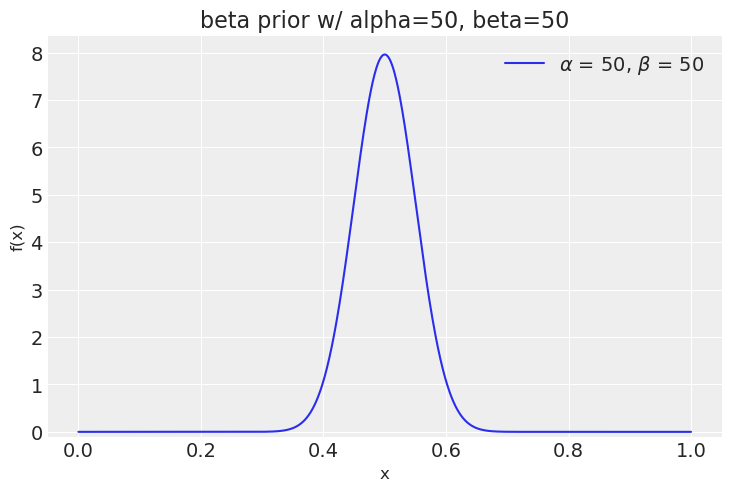

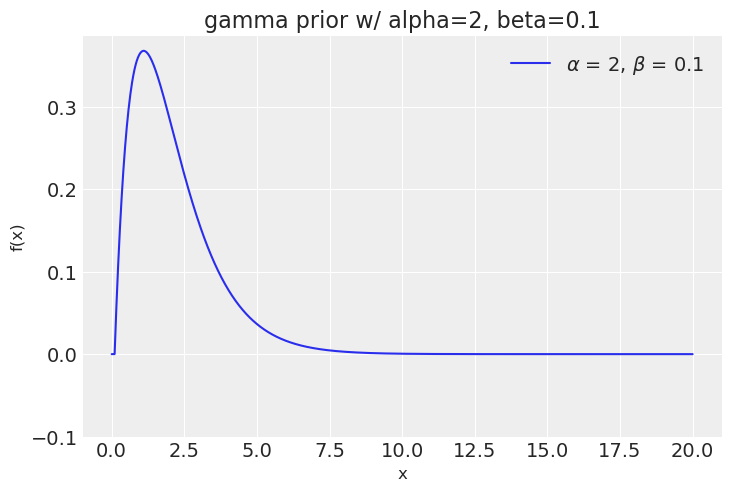

In [3]:
import scipy as sp


def vis_beta(a: float, b: float) -> None:
    xs = np.linspace(0, 1, 1_000)
    pdf = sp.stats.beta.pdf(xs, a, b)
    plt.plot(xs, pdf, label=r"$\alpha$ = {}, $\beta$ = {}".format(a, b))
    plt.ylim(
        -0.1,
    )
    plt.xlabel("x", fontsize=12)
    plt.ylabel("f(x)", fontsize=12)
    plt.legend(loc=1)
    plt.title(f"beta prior w/ alpha={a}, beta={b}")
    plt.show()


vis_beta(50, 50)


def vis_gamma(a: float, b: float) -> None:
    xs = np.linspace(0, 20, 1_000)
    pdf = sp.stats.gamma.pdf(xs, a, b)
    plt.plot(xs, pdf, label=r"$\alpha$ = {}, $\beta$ = {}".format(a, b))
    plt.ylim(
        -0.1,
    )
    plt.xlabel("x", fontsize=12)
    plt.ylabel("f(x)", fontsize=12)
    plt.legend(loc=1)
    plt.title(f"gamma prior w/ alpha={a}, beta={b}")
    plt.show()


vis_gamma(2, 0.1)

In [4]:
SEED = 2001
N_GEOS = 50  # e.g. 50 states in US
WKS_IN_YR = 52
MAX_WEEKS = 5 * WKS_IN_YR  # 5 years
BASELINE_SPEND = (
    25  # USD, we'll then twist this with various correlated + uncorrelated noise
)
# one challenge w/ MMM is that realistically, spend doesn't fluctuate dramatically;
# here rel. to mean of 1-ish, it's about 1/10 of spend, which seems not-crazy.
POOLED_SPEND_STD_SCALING = 0.10
MEAN_CPA = 5.0  # USD 'cost per action' = buy our product
SEASONALITY_SCALE = 0.1  # percent
# Realistically, don't assume channels are equal size.
CHANNEL_SCALE = {
    "google_nonbrand": 4,
    "google_brand": 1.5,
    "facebook": 3,
    "instagram": 1,
    "direct_mail": 1,
    "youtube": 1,
    "sponsored_content": 0.5,
    "bing": 0.5,
    "pinterest": 0.25,
    "out_of_home": 0.5,
}
# Limitation: would like efficiency to drift.
CHANNEL_EFFICIENCY = {  # as multiple of average
    "google_nonbrand": 1.0,
    "google_brand": 1.5,  # ignore causal issues w/ branded ads for now
    "facebook": 1.1,
    "instagram": 1.2,
    "direct_mail": 1.25,
    "youtube": 1.2,
    "sponsored_content": 1.25,
    "bing": 1.4,
    "pinterest": 1.2,
    "out_of_home": 0.5,
}
assert CHANNEL_SCALE.keys() == CHANNEL_EFFICIENCY.keys()

# Numpy recommends `generator` interface going forward.
rng = np.random.default_rng(SEED)


def additive_random_walk(
    n: int, mu: float = 0.1, sigma: float = 0.01, start: float = 100
):
    """
    Additive or multiplicative seems defensible for demand.
    """
    walk = rng.normal(mu, sigma, size=n)
    return start + np.cumsum(walk)


# Simulate market tenure as uniformly distributed from start-->3/4 through timeseries.
market_start_idxs = {
    i: first_week
    for i, first_week in enumerate(rng.integers(0, (3 * MAX_WEEKS) // 4, size=N_GEOS))
}

# Simulate basic market-level characteristics.
chunks = []
for market, start_i in market_start_idxs.items():
    this_market = pd.DataFrame(
        [i for i in range(start_i, MAX_WEEKS)], columns=["week_i"]
    )
    this_market["market_idx"] = market
    this_market["market"] = "geo_" + str(market)
    # Simulate populations as drawn from a lognormal distribution.
    # (pareto would also be defensible; see e.g. https://sites.tufts.edu/yioannides/files/2012/09/ioannides-skouras-june-21-2012.pdf )
    # note: parameterized by LOGGED dist, not raw.
    this_market["population"] = rng.lognormal(15.5, 1.0)

    # Note: marking private fields used in simulation with leading underscore.
    #       These should never be used in our models.

    # Don't assume equal efficiency everywhere!
    # Centered @ 1.0
    this_market["_market_efficiency"] = 2 * rng.beta(20, 20)

    # Add baseline/organic demand.
    # Negative binomial will show the overdispersion typical of real-world purchase data.
    # I believe at p=0.5, equivalent to poisson.
    pop_this_geo = this_market.population[0]
    this_market["_baseline_demand"] = rng.negative_binomial(
        pop_this_geo / 100_000, 0.7, size=this_market.shape[0]
    )

    chunks.append(this_market)

spends = pd.concat(chunks)
spends.market = spends.market.astype("category")
mean_market_size = this_market.population.mean()
# Assume spend scaled to population.
# We'll then introduce random walks/trends and noise based on this.
spends["_avg_spend"] = BASELINE_SPEND * (spends["population"] / mean_market_size)

# Add confounds:
# - pricing (demand), assume linear price elasticity, observable
# - interest in pour-over coffee (demand), will also model as simple linear effect. note this is unobservable.
# - seasonality
# - (more to come, eventually)
PRICE_ELASTICITY = 0.25  # loosely defined; I'm not an economist ;)
spends["price"] = 40
spends.loc[spends.week_i > 1 * WKS_IN_YR, "price"] = 35
spends.loc[spends.week_i > 2 * WKS_IN_YR, "price"] = 30
spends.loc[spends.week_i > 3 * WKS_IN_YR, "price"] = 25
spends["_price_demand"] = 1 + (spends.price / 40) * PRICE_ELASTICITY

coffee_interest_ts = pd.Series(
    additive_random_walk(MAX_WEEKS, mu=5e-3, sigma=3e-2, start=1),
    index=range(MAX_WEEKS),
    name="_coffee_interest",
)
len_before = len(spends)
spends = spends.merge(
    coffee_interest_ts, how="inner", left_on="week_i", right_index=True, validate="m:1"
)
assert len(spends) == len_before
COFFEE_INTEREST_DEMAND_SCALE = 0.25
spends["_coffee_interest_demand"] = (
    1 + spends._coffee_interest * COFFEE_INTEREST_DEMAND_SCALE
)

# Cosine seasonality (sell better @ holidays)
week_idxs = np.arange(0, WKS_IN_YR, 1)
seasonality = pd.DataFrame(
    index=week_idxs,
    data=1 + SEASONALITY_SCALE * np.cos(week_idxs * 2 * np.pi / WKS_IN_YR),
    columns=["_seasonality"],
)
seasonality.index = seasonality.index.rename("wk_in_yr")
spends["wk_in_yr"] = spends.week_i % 52
spends = spends.merge(
    seasonality, how="inner", left_on="wk_in_yr", right_index=True, validate="m:1"
)
assert len(spends) == len_before
assert spends.wk_in_yr.between(0, WKS_IN_YR).all()

# Treat all spends as following:
# + marketing stakeholders' general desire to spend (random walk for ALL channel)
# + marketing stakeholders' preferences b/w channels (channel-level walk)
# + noise
spends_trend = pd.Series(
    np.abs(additive_random_walk(MAX_WEEKS, mu=1e-2, sigma=1e-1, start=1)),
    index=range(MAX_WEEKS),
    name="_spend_trend",
)
spends = spends.merge(
    spends_trend, how="inner", left_on="week_i", right_index=True, validate="m:1"
)
assert len(spends) == len_before

# Simulate (market, channel) spends and outcomes.
# Remember a row = 1 week in 1 market; cols for different spends in a given week.
spends["n_purchased"] = 0
for channel, scale in CHANNEL_SCALE.items():
    # Channel level IID noise + walk.
    spend_amt_noise = 2 * rng.beta(50, 50, size=spends.shape[0])
    channel_preference = pd.Series(
        np.abs(additive_random_walk(MAX_WEEKS, mu=0, sigma=2.5e-2, start=1)),
        index=range(MAX_WEEKS),
        name=f"_{channel}_spend_preference",
    )
    spends = spends.merge(
        channel_preference,
        how="inner",
        left_on="week_i",
        right_index=True,
        validate="m:1",
    )
    spends[channel] = (
        spend_amt_noise
        * scale
        * spends._avg_spend
        * spends._spend_trend
        * spends[f"_{channel}_spend_preference"]
    )

    spend_efficiency_noise = 2 * rng.beta(50, 50, size=spends.shape[0])

    # Finally, outcome based on marketing + confounding.
    # 1) determine efficiency (RoAS) to recover.
    # (TODO: should revisit what "true efficiency" we really want to recover - should it include e.g. price elasticity?
    spends[f"_{channel}_true_efficiency"] = (
        (CHANNEL_EFFICIENCY[channel]) * (1 / MEAN_CPA) * spends._market_efficiency
    )
    # Add confounding + noise.
    spends["n_purchased"] = (
        spends["n_purchased"]
        + spends[channel]
        * spends[f"_{channel}_true_efficiency"]
        * spends._coffee_interest_demand
        * spends._price_demand
        * spends._seasonality
        * spend_efficiency_noise
    ).round()  # can't sell fractional brewers ;)

# Also add baseline / ad-free organic demand.
baseline_demand_noise = np.abs(rng.normal(1, 0.5, size=len(spends)))
spends["n_purchased"] = (
    spends["n_purchased"] + spends._baseline_demand * baseline_demand_noise
)
spends["total_spend"] = spends[list(CHANNEL_SCALE.keys())].sum(axis="columns")
spends = spends.round(3)

spends

,week_i,market_idx,market,population,_market_efficiency,_baseline_demand,_avg_spend,price,_price_demand,_coffee_interest,_coffee_interest_demand,wk_in_yr,_seasonality,_spend_trend,n_purchased,_google_nonbrand_spend_preference,google_nonbrand,_google_nonbrand_true_efficiency,_google_brand_spend_preference,google_brand,_google_brand_true_efficiency,_facebook_spend_preference,facebook,_facebook_true_efficiency,_instagram_spend_preference,instagram,_instagram_true_efficiency,_direct_mail_spend_preference,direct_mail,_direct_mail_true_efficiency,_youtube_spend_preference,youtube,_youtube_true_efficiency,_sponsored_content_spend_preference,sponsored_content,_sponsored_content_true_efficiency,_bing_spend_preference,bing,_bing_true_efficiency,_pinterest_spend_preference,pinterest,_pinterest_true_efficiency,_out_of_home_spend_preference,out_of_home,_out_of_home_true_efficiency,total_spend
0,3,0,geo_0,3.677349e+07,1.099,197,128.521,40,1.250,0.924,1.231,3,1.094,0.895,686.908,1.062,523.301,0.220,1.011,193.056,0.330,0.909,304.174,0.242,1.017,130.873,0.264,1.024,110.666,0.275,0.999,109.263,0.264,0.930,54.433,0.275,1.085,68.858,0.308,1.003,28.403,0.264,0.920,43.751,0.110,1566.778
52,55,0,geo_0,3.677349e+07,1.099,157,128.521,30,1.188,1.211,1.303,3,1.094,1.340,1020.757,1.157,712.467,0.220,0.972,247.846,0.330,0.936,401.398,0.242,1.163,165.659,0.264,1.098,190.390,0.275,1.410,271.316,0.264,0.921,74.110,0.275,1.177,91.160,0.308,0.959,41.157,0.264,0.745,63.559,0.110,2259.062
12,55,2,geo_2,4.475771e+07,0.733,192,156.425,30,1.188,1.211,1.303,3,1.094,1.340,927.984,1.157,1020.516,0.147,0.972,329.830,0.220,0.936,632.605,0.161,1.163,217.367,0.176,1.098,237.857,0.183,1.410,322.197,0.176,0.921,101.018,0.183,1.177,142.764,0.205,0.959,45.882,0.176,0.745,86.703,0.073,3136.738
16,55,3,geo_3,9.964031e+05,1.156,4,3.482,30,1.188,1.211,1.303,3,1.094,1.340,28.911,1.157,20.597,0.231,0.972,6.513,0.347,0.936,12.373,0.254,1.163,4.816,0.277,1.098,6.022,0.289,1.410,6.791,0.277,0.921,2.501,0.289,1.177,3.047,0.324,0.959,1.113,0.277,0.745,1.432,0.116,65.204
51,55,6,geo_6,1.380624e+06,0.912,8,4.825,30,1.188,1.211,1.303,3,1.094,1.340,37.553,1.157,30.660,0.182,0.972,8.794,0.274,0.936,14.727,0.201,1.163,8.187,0.219,1.098,6.537,0.228,1.410,11.509,0.219,0.921,2.711,0.228,1.177,4.137,0.255,0.959,1.717,0.219,0.745,2.231,0.091,91.211
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45,210,45,geo_45,3.959841e+06,0.841,25,13.839,25,1.156,2.427,1.607,2,1.097,1.735,155.217,1.527,147.104,0.168,0.598,19.651,0.252,1.141,77.989,0.185,1.155,24.945,0.202,1.269,35.051,0.210,1.175,28.146,0.202,1.265,12.494,0.210,1.160,13.936,0.236,0.933,4.691,0.202,0.528,6.705,0.084,370.711
115,210,46,geo_46,1.439907e+07,0.955,54,50.324,25,1.156,2.427,1.607,2,1.097,1.735,670.503,1.527,521.283,0.191,0.598,81.716,0.287,1.141,317.859,0.210,1.155,97.809,0.229,1.269,112.825,0.239,1.175,90.391,0.229,1.265,43.550,0.239,1.160,40.367,0.267,0.933,20.807,0.229,0.528,24.702,0.096,1351.310
161,210,47,geo_47,8.959465e+06,1.000,41,31.313,25,1.156,2.427,1.607,2,1.097,1.735,502.477,1.527,340.494,0.200,0.598,53.958,0.300,1.141,193.480,0.220,1.155,72.826,0.240,1.269,81.395,0.250,1.175,59.471,0.240,1.265,29.341,0.250,1.160,35.938,0.280,0.933,13.617,0.240,0.528,14.088,0.100,894.609
102,210,48,geo_48,3.589552e+06,0.950,15,12.545,25,1.156,2.427,1.607,2,1.097,1.735,150.167,1.527,132.575,0.190,0.598,19.711,0.285,1.141,61.168,0.209,1.155,27.103,0.228,1.269,29.022,0.238,1.175,21.378,0.228,1.265,12.979,0.238,1.160,12.024,0.266,0.933,4.538,0.228,0.528,5.319,0.095,325.817


Text(0.5, 1.0, 'Five sampled coffee interest/demand random walks')

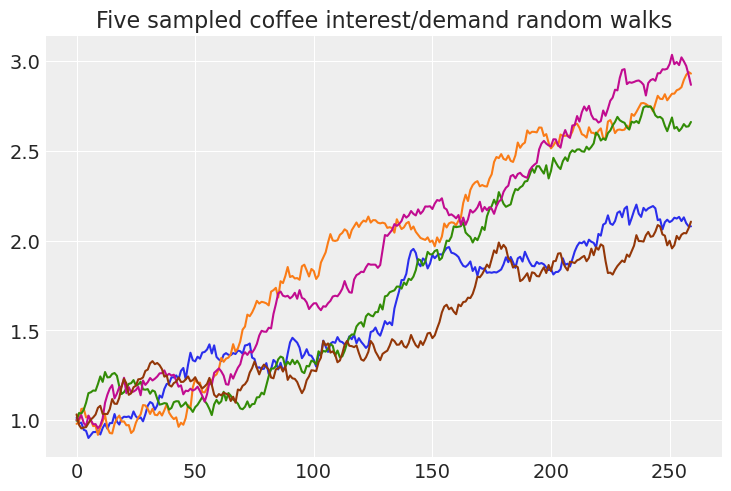

Text(0.5, 1.0, 'Five sampled (global) spend random walks')

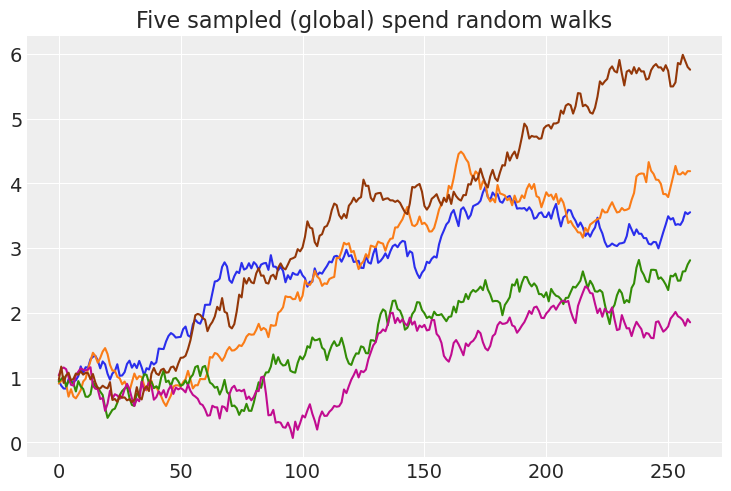

Text(0.5, 1.0, 'Five sampled spend preference')

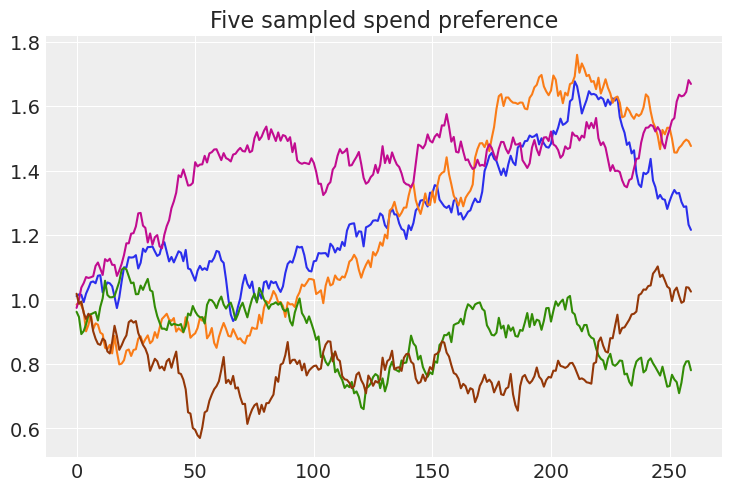

In [111]:
# develop intuition for random walk params.
for i in range(5):
    walk = pd.Series(
        additive_random_walk(MAX_WEEKS, mu=5e-3, sigma=3e-2, start=1),
        index=range(MAX_WEEKS),
        name="_coffee_interest",
    )
    plt.plot(walk)
_ = plt.title("Five sampled coffee interest/demand random walks")
_ = plt.show()

for i in range(5):
    walk = pd.Series(
        np.abs(additive_random_walk(MAX_WEEKS, mu=1e-2, sigma=1e-1, start=1)),
        index=range(MAX_WEEKS),
        name="_spend_trend",
    )
    plt.plot(walk)
_ = plt.title("Five sampled (global) spend random walks")
_ = plt.show()

for i in range(5):
    walk = pd.Series(
        np.abs(additive_random_walk(MAX_WEEKS, mu=0, sigma=2.5e-2, start=1)),
        index=range(MAX_WEEKS),
        name=f"_{channel}_spend_preference",
    )
    plt.plot(walk)
_ = plt.title("Five sampled spend preference")
_ = plt.show()

noting a few limitations:  
- something with breakpoints would probably be slightly more realistic - typically stakeholders will make decisions with logic like "I think x channel hasn't been doing well" or "we're spending too much, need to pull back." not a strict random walk.    
- lack of adstock (ad efficacy isn't perfectly instantaneous and doesn't decay instantaneously)  
- lack of saturation (reduced efficiency at high spends)  

In [9]:
# QA
# We could use great_expectations, but I'll be slightly lazy and use use bare asserts.

spend_cols = list(CHANNEL_SCALE.keys())

POS_COLS = [
    "population",
    "_market_efficiency",
    "_baseline_demand",
    "_avg_spend",
    "price",
    "_price_demand",
    "_coffee_interest",
    "_coffee_interest_demand",
    "_spend_trend",
    "n_purchased",
    "total_spend",
] + spend_cols

notna_cols = POS_COLS

assert all([(spends[c] >= 0).all() for c in POS_COLS])
assert all([spends[c].notna().all() for c in notna_cols])

Text(0.5, 0, 'Week Index')

Text(0, 0.5, 'Weekly Spend (Across All Geos)')

Text(0.5, 1.0, 'Spend Trend (Across All Geos)')

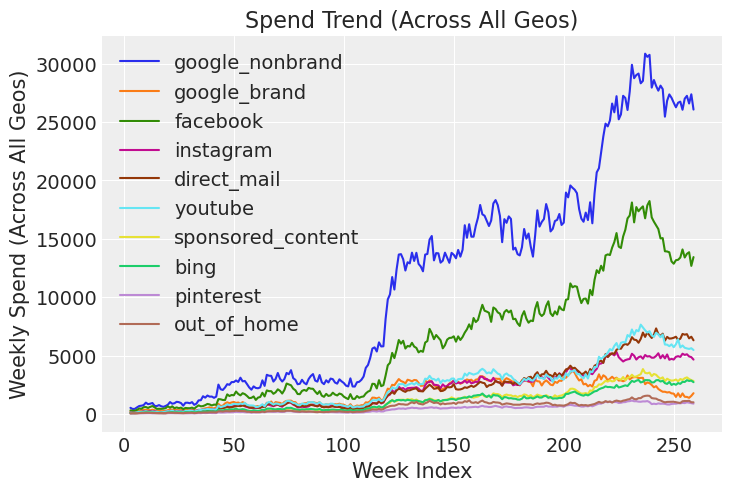

In [10]:
# QA spend trends

OUTCOME = "n_purchased"
# note: I use confound loosely to mean "things that affect the outcome that aren't affected by the treatment".
#       A more correct definition might restrict it to needing to affect the treatment value.
GOOD_CONTROLS = [
    "market",
    "price",  # this control is not strictly necessary but will likely improve our finite sample estimate
]
BAD_CONTROLS = [
    "population"
]  # controling will dilute our marketing spend effect, since its effect is fully through marketing spend!

for channel in spend_cols:
    weekly_spend = spends.groupby("week_i")[channel].sum()
    _ = plt.plot(weekly_spend, alpha=.7)

plt.xlabel("Week Index")
plt.ylabel("Weekly Spend (Across All Geos)")
plt.title("Spend Trend (Across All Geos)")
plt.legend(CHANNEL_SCALE.keys())

Text(0.5, 0, 'Week Index')

Text(0, 0.5, 'Weekly Spend (Sample Single Geo)')

Text(0.5, 1.0, 'Spend Trend (Sample Single Geo)')

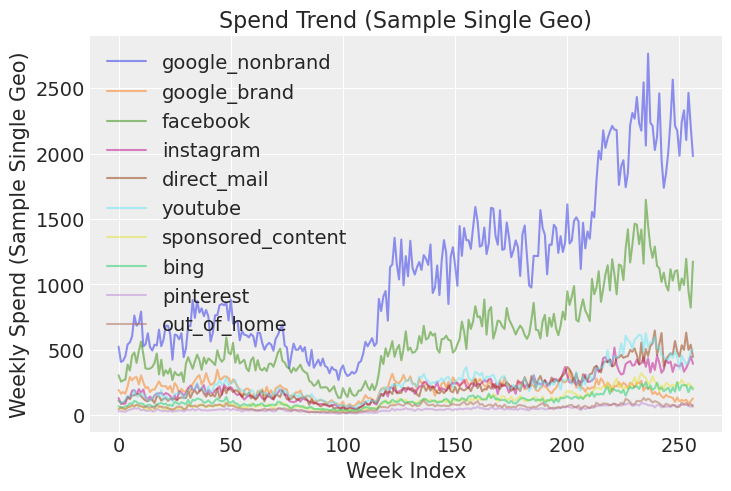

In [123]:
# Natl. level hides some trends - view within a given market.

oldest_market = spends.market.value_counts().index[0]

for channel in CHANNEL_SCALE.keys():
    weekly_spend = spends.loc[spends.market == oldest_market].sort_values(
        "week_i", ascending=True
    )[channel]
    _ = plt.plot(weekly_spend, alpha=0.7)

plt.xlabel("Week Index")
plt.ylabel("Weekly Spend (Sample Single Geo)")
plt.title("Spend Trend (Sample Single Geo)")
plt.legend(CHANNEL_SCALE.keys())

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Reminder: purchased qty very right-skewed')

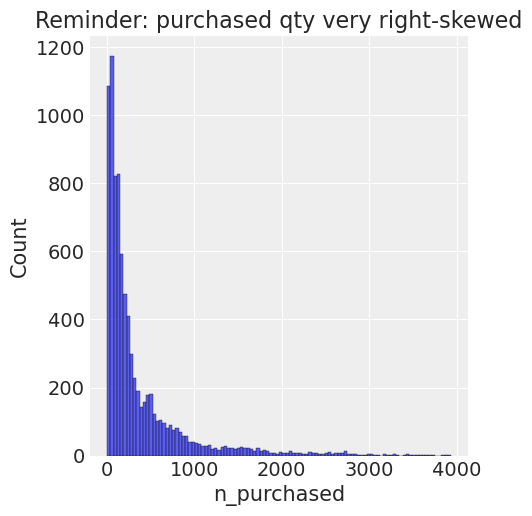

In [115]:
sns.displot(spends.n_purchased)
plt.title("Reminder: purchased qty very right-skewed")

#### Parameters to recover

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Market-level Efficiency of google_nonbrand')

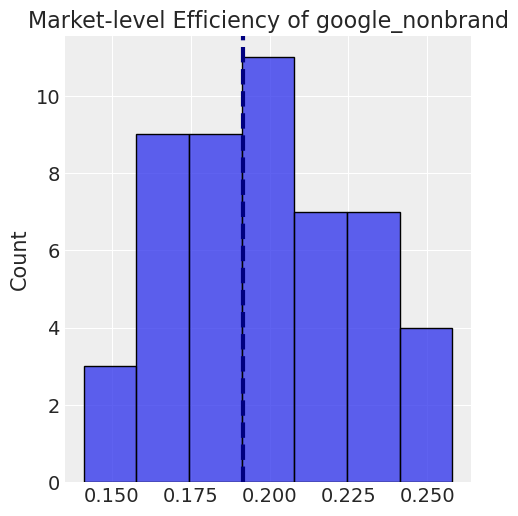

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Market-level Efficiency of google_brand')

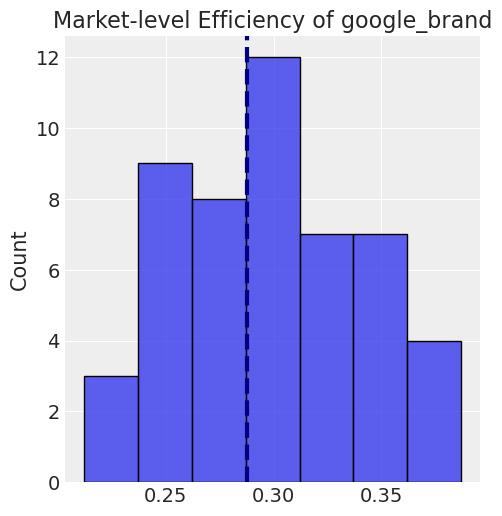

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Market-level Efficiency of facebook')

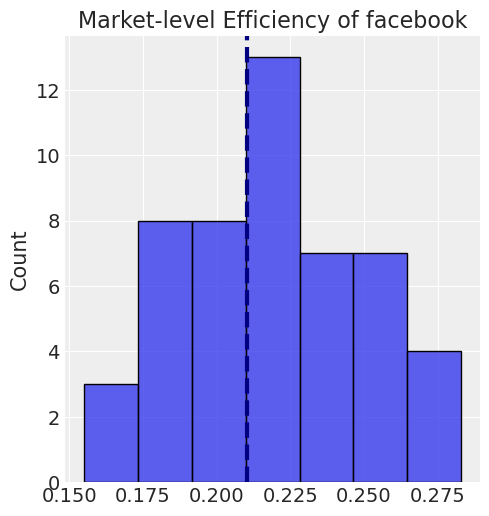

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Market-level Efficiency of instagram')

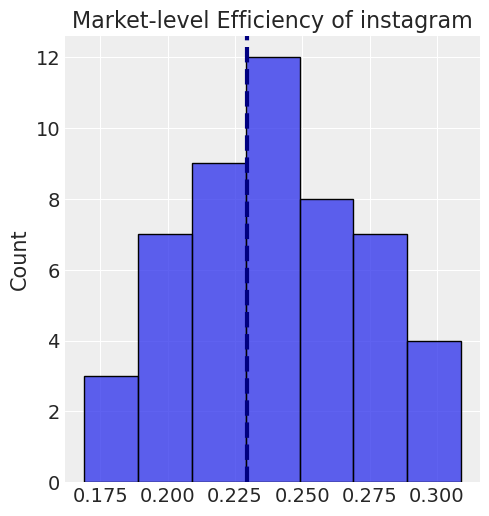

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Market-level Efficiency of direct_mail')

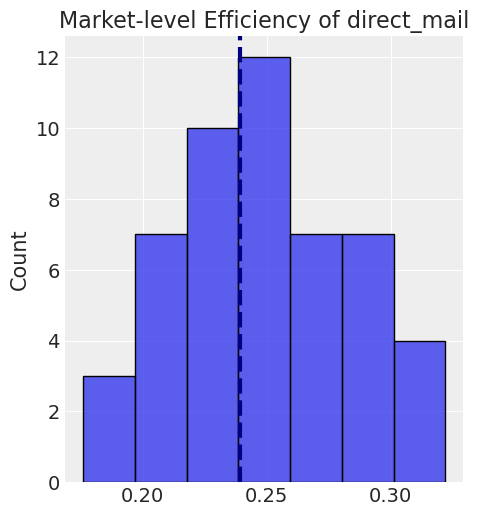

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Market-level Efficiency of youtube')

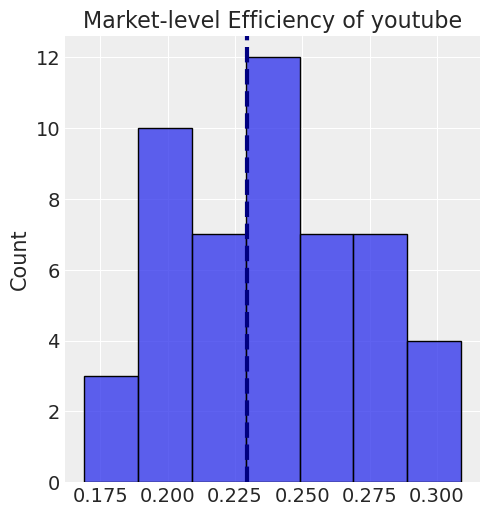

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Market-level Efficiency of sponsored_content')

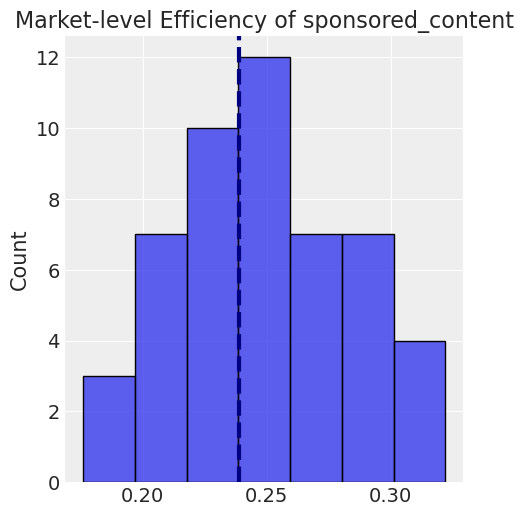

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Market-level Efficiency of bing')

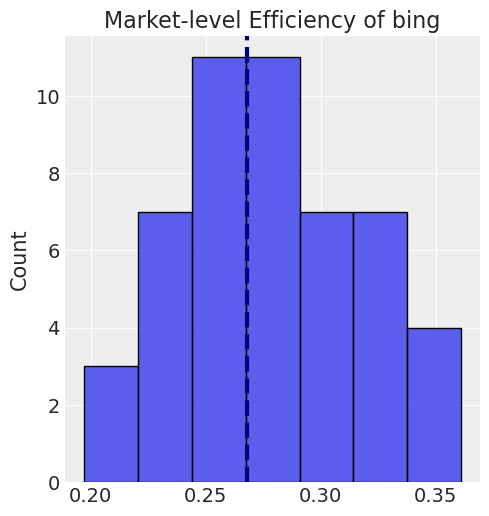

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Market-level Efficiency of pinterest')

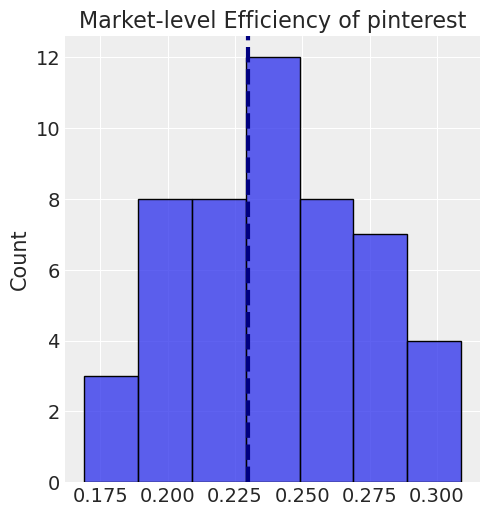

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'Market-level Efficiency of out_of_home')

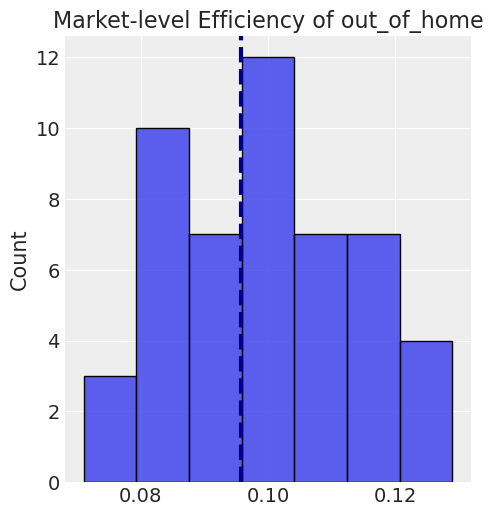

,overall_efficiency
google_brand,0.288
bing,0.268
direct_mail,0.239
sponsored_content,0.239
instagram,0.230
youtube,0.230
pinterest,0.230
facebook,0.210
google_nonbrand,0.191
out_of_home,0.096


In [124]:
true_efficiencies = pd.DataFrame(index=spend_cols)

# perhaps could be a wonky pivot, we'll just use a for.
# we'll aim to recover the weighted average efficiency (RoAS) over the full timeseries.
for spend_col in spend_cols:
    mkt_efficiency = (
        spends.groupby("market")
        .apply(
            lambda ser: (
                ser[f"_{spend_col}_true_efficiency"]
                * ser[spend_col]
                / ser[spend_col].sum()
            ).sum()
        )
        .sort_index()
    )
    sns.displot(mkt_efficiency)
    plt.title(f"Market-level Efficiency of {spend_col}")

    overall_efficiency = (
        spends[f"_{spend_col}_true_efficiency"]
        * spends[spend_col]
        / spends[spend_col].sum()
    ).sum()
    true_efficiencies.loc[spend_col, "overall_efficiency"] = overall_efficiency
    plt.axvline(overall_efficiency, color="navy", linestyle="--", linewidth=3)

    plt.show()

true_efficiencies = true_efficiencies.round(3).sort_values(
    "overall_efficiency", ascending=False
)
true_efficiencies

## Modeling

Broadly, here's my wishlist of models to fit:  
- Frequentist, fixed effects, no confounding
- Frequentist, random/unpooled (slope and intercept)
- Frequentist, bad controls (stick everything in)
- Frequentist, roughly correctly specified

- Bayesian mixed effects
- (Bayesian with random walk)
- (Bayesian with saturation and/or decay)
- Our preferred Bayesian model but fit with minibatch full rank ADVI
- Our preferred Bayesian model but fit with SVGD

We'll start with more basic ones, build up to more complex ones, and then try speeding things up a bit.  

### Frequentist Models

In [125]:
# Most basic model, ignoring confounding entirely.
import statsmodels.formula.api as smf
import statsmodels.api as sm

model = smf.ols(
    f"{OUTCOME} ~ {' + '.join(spend_cols)}",
    data=spends,
)
fitted = model.fit(cov_type="HC3")
fitted.summary()

model = smf.glm(
    f"{OUTCOME} ~ {' + '.join(spend_cols)}",
    data=spends,
    family=sm.families.NegativeBinomial(),
)
fitted = model.fit(cov_type="HC3")
fitted.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            n_purchased   R-squared:                       0.957
Model:                            OLS   Adj. R-squared:                  0.957
Method:                 Least Squares   F-statistic:                     2821.
Date:                Sun, 28 Nov 2021   Prob (F-statistic):               0.00
Time:                        11:27:33   Log-Likelihood:                -52500.
No. Observations:                8567   AIC:                         1.050e+05
Df Residuals:                    8556   BIC:                         1.051e+05
Df Model:                          10                                         
Covariance Type:                  HC3                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept            23.0741      1.348     17.117      0.000      20.432      25.716
google_nonbrand       0.3971      0.046      8.688      0.000       0.308       0.487
google_brand          0.1815      0.154      1.178      0.239      -0.121       0.484
facebook              0.1130      0.087      1.299      0.194      -0.058       0.284
instagram             1.6508      0.271      6.085      0.000       1.119       2.182
direct_mail           0.5682      0.210      2.701      0.007       0.156       0.981
youtube              -0.0066      0.194     -0.034      0.973      -0.387       0.373
sponsored_content    -0.3463      0.475     -0.729      0.466      -1.278       0.585
bing                  1.5099      0.499      3.028      0.002       0.533       2.487
pinterest             2.9386      1.218      2.412      0.016       0.550       5.327
out_of_home          -1.6055      0.640     -2.510      0.012      -2.859      -0.352
==============================================================================
Omnibus:                     3034.738   Durbin-Watson:                   1.826
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            83119.641
Skew:                           1.108   Prob(JB):                         0.00
Kurtosis:                      18.098   Cond. No.                         915.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC3)
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:            n_purchased   No. Observations:                 8567
Model:                            GLM   Df Residuals:                     8556
Model Family:        NegativeBinomial   Df Model:                           10
Link Function:                    log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -55093.
Date:                Sun, 28 Nov 2021   Deviance:                       3811.0
Time:                        11:27:33   Pearson chi2:                 2.75e+03
No. Iterations:                    24   Pseudo R-squ. (CS):             0.6397
Covariance Type:                  HC3                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             4.6713      0.013    371.150      0.000       4.647       4.696
google_nonbrand       0.0006      0.000      4.029      0.000       0.000       0.001
google_brand          0.0036      0.001      6.800      0.000       0.003       0.005
facebook           6.335e-05      0.000      0.202      0.840      -0.001       0.001
instagram             0.0006      0.001      0.686      0.492      -0.001       0.002
direct_mail           0.0020      0.001      2.833      0.005       0.001       0.003
youtube              -0.0002      0.001     -0.272      0.786      -0.002       0.001
sponsored_content    -0.0008      0.002     -0.542      0.588      -0.004       0.002
bing                  0.0033      0.002      1.864      0.062      -0.000       0.007
pinterest             0.0109      0.004      2.427      0.015       0.002       0.020
out_of_home          -0.0012      0.002     -0.544      0.586      -0.006       0.003
=====================================================================================
"""

- given large purchase numbers, not strictly necessary to avoid identity/OLS linear regression  
- note that our spend coefficients are __way off__ and not ranked terribly well due ignored confounding!  
- despite this, R2 is very high; reminder to not assume that high R2 means the model should be taken seriously.  

In [449]:
# "ok, but you didn't include confounds"
# "let's include the kitchen sink"

model = smf.ols(
    f"{OUTCOME} ~ {' + '.join(spend_cols + GOOD_CONTROLS + BAD_CONTROLS)}",
    data=spends,
)
fitted = model.fit(cov_type="HC3")
fitted.summary()

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/statsmodels/base/model.py:1863: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 59, but rank is 58
  warnings.warn('covariance of constraints does not have full '


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            n_purchased   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     574.3
Date:                Fri, 26 Nov 2021   Prob (F-statistic):               0.00
Time:                        14:33:14   Log-Likelihood:                -51364.
No. Observations:                7748   AIC:                         1.028e+05
Df Residuals:                    7689   BIC:                         1.033e+05
Df Model:                          58                                         
Covariance Type:                  HC3                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept          -196.1880     34.093     -5.754      0.000    -263.010    -129.366
market[T.geo_1]     -45.1405      5.951     -7.585      0.000     -56.804     -33.477
market[T.geo_10]    -36.2661      5.232     -6.932      0.000     -46.521     -26.012
market[T.geo_11]    141.6625     14.674      9.654      0.000     112.901     170.424
market[T.geo_12]    690.3521     23.430     29.465      0.000     644.431     736.274
market[T.geo_13]   -103.4798      5.622    -18.405      0.000    -114.499     -92.460
market[T.geo_14]   -106.5638     12.377     -8.610      0.000    -130.823     -82.305
market[T.geo_15]   1785.1695     62.195     28.703      0.000    1663.269    1907.070
market[T.geo_16]    -61.8984      5.689    -10.881      0.000     -73.048     -50.748
market[T.geo_17]   -572.7599     12.277    -46.652      0.000    -596.823    -548.697
market[T.geo_18]    -24.3041      6.041     -4.023      0.000     -36.144     -12.464
market[T.geo_19]     -2.9960      5.407     -0.554      0.580     -13.593       7.601
market[T.geo_2]    -450.3019     42.847    -10.510      0.000    -534.280    -366.324
market[T.geo_20]    -81.0307      5.534    -14.643      0.000     -91.877     -70.185
market[T.geo_21]    -13.2497      8.555     -1.549      0.121     -30.017       3.517
market[T.geo_22]    -16.5465      5.475     -3.022      0.003     -27.276      -5.817
market[T.geo_23]   -103.0492      7.739    -13.315      0.000    -118.218     -87.881
market[T.geo_24]   -465.8765     11.413    -40.818      0.000    -488.246    -443.507
market[T.geo_25]     -2.1898      5.693     -0.385      0.701     -13.348       8.968
market[T.geo_26]    -79.9952      6.738    -11.872      0.000     -93.201     -66.789
market[T.geo_27]    -30.1403      6.152     -4.899      0.000     -42.199     -18.082
market[T.geo_28]   -243.2304     13.177    -18.459      0.000    -269.057    -217.404
market[T.geo_29]   -209.4255      9.557    -21.914      0.000    -228.156    -190.695
market[T.geo_3]    -193.1731     33.722     -5.728      0.000    -259.267    -127.080
market[T.geo_30]    144.7065     25.416      5.694      0.000      94.893     194.520
market[T.geo_31]    157.2276      8.919     17.628      0.000     139.747     174.709
market[T.geo_32]   -824.6184     23.369    -35.287      0.000    -870.420    -778.817
market[T.geo_33]   -725.0133     13.982    -51.852      0.000    -752.418    -697.608
market[T.geo_34]     21.2272      6.866      3.092      0.002       7.771      34.684
market[T.geo_35]     34.5471      6.047      5.713      0.000      22.694      46.400
market[T.geo_36]   -157.4569      7.393    -21.299      0.000    -171.946    -142.968
market[T.geo_37]   -209.7766      5.973    -35.122      0.000    -221.483    -198.070
market[T.geo_38]    -57.9688      5.053    -11.473      0.000     -67.872

now our coefficients are at least positive - and sometimes include their true-ish values in their CIs - but still way off.  

In [126]:
# less flippantly, build something a little more principled

model = smf.ols(
    f"{OUTCOME} ~ {' + '.join(spend_cols + GOOD_CONTROLS)}",
    data=spends,
)
fitted = model.fit_regularized(alpha=1e-2, refit=True)
fitted.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            n_purchased   R-squared:                       0.983
Model:                            OLS   Adj. R-squared:                  0.983
Method:                 Least Squares   F-statistic:                     7935.
Date:                Sun, 28 Nov 2021   Prob (F-statistic):               0.00
Time:                        11:29:20   Log-Likelihood:                -48591.
No. Observations:                8567   AIC:                         9.731e+04
Df Residuals:                    8506   BIC:                         9.774e+04
Df Model:                          61                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept           430.8388     11.578     37.212      0.000     408.143     453.535
market[T.geo_1]    -364.9849      9.717    -37.561      0.000    -384.033    -345.937
market[T.geo_10]   -311.0904      8.386    -37.095      0.000    -327.530    -294.651
market[T.geo_11]   -296.1356      7.011    -42.240      0.000    -309.879    -282.393
market[T.geo_12]   -342.0736     10.074    -33.957      0.000    -361.820    -322.327
market[T.geo_13]   -356.0559     11.795    -30.186      0.000    -379.178    -332.934
market[T.geo_14]   -362.8722      9.387    -38.657      0.000    -381.273    -344.471
market[T.geo_15]   -357.0877     10.387    -34.377      0.000    -377.449    -336.726
market[T.geo_16]   -229.1823      8.439    -27.156      0.000    -245.725    -212.639
market[T.geo_17]   -378.0820      9.281    -40.736      0.000    -396.276    -359.888
market[T.geo_18]   -340.2784      9.110    -37.351      0.000    -358.137    -322.420
market[T.geo_19]   -367.0305      9.172    -40.016      0.000    -385.010    -349.051
market[T.geo_2]    -431.0192      6.680    -64.526      0.000    -444.113    -417.925
market[T.geo_20]   -333.5416      9.001    -37.054      0.000    -351.186    -315.897
market[T.geo_21]   -363.1949     11.552    -31.441      0.000    -385.839    -340.551
market[T.geo_22]   -345.0920      9.584    -36.007      0.000    -363.879    -326.305
market[T.geo_23]   -363.7494      9.748    -37.315      0.000    -382.858    -344.641
market[T.geo_24]   -273.6904      9.502    -28.802      0.000    -292.318    -255.063
market[T.geo_25]   -359.7982      9.371    -38.393      0.000    -378.168    -341.428
market[T.geo_26]   -310.7939      8.603    -36.124      0.000    -327.659    -293.929
market[T.geo_27]   -345.7052      9.831    -35.165      0.000    -364.976    -326.434
market[T.geo_28]   -372.3222      9.409    -39.573      0.000    -390.765    -353.879
market[T.geo_29]   -337.5043      9.174    -36.790      0.000    -355.487    -319.522
market[T.geo_3]    -362.2049      9.491    -38.163      0.000    -380.809    -343.600
market[T.geo_30]   -344.5357      9.997    -34.463      0.000    -364.133    -324.938
market[T.geo_31]   -342.4362      9.382    -36.499      0.000    -360.827    -324.045
market[T.geo_32]   -368.5390      9.632    -38.263      0.000    -387.420    -349.658
market[T.geo_33]   -356.4999      9.681    -36.823      0.000    -375.478    -337.522
market[T.geo_34]   -343.2339      8.527    -40.254      0.000    -359.948    -326.519
market[T.geo_35]   -366.7789     10.255    -35.766      0.000    -386.881    -346.676
market[T.geo_36]   -370.9875      8.278    -44.817      0.000    -387.214    -354.761
market[T.geo_37]   -301.6701     10.520    -28.676      0.000    -322.292    -281.049
market[T.geo_38]   -320.3308     11.136    -28.764      0.000    -342.161

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:ylabel='n_purchased'>

Text(0.5, 1.0, 'good-ish frequentist fixed effects LM: QA Residuals')

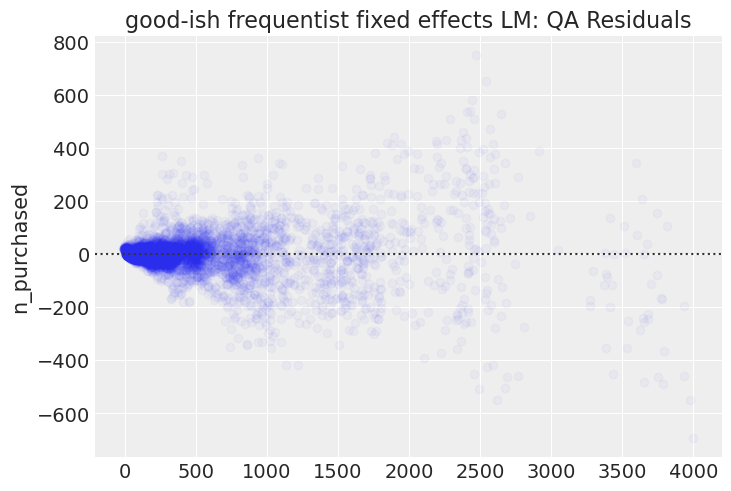

Text(0.5, 0.98, 'good-ish frequentist fixed effects LM: Normal Q-Q plot of resid., R^2 == 0.71')

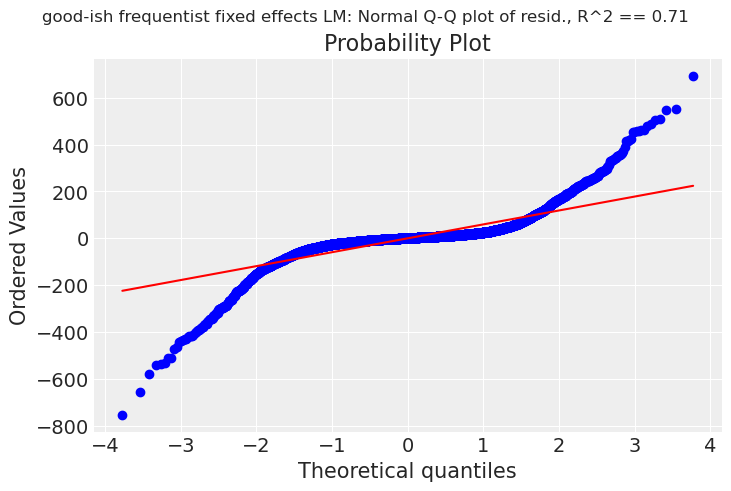

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'good-ish frequentist fixed effects LM: Residual distribution')

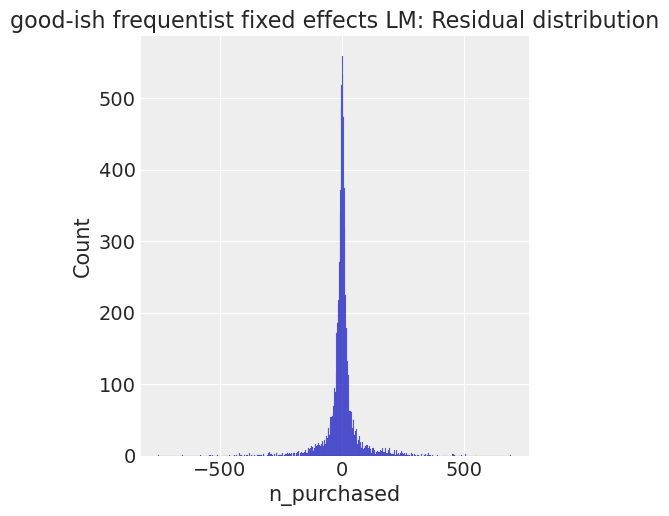

In [127]:
sns.residplot(
    fitted.fittedvalues,
    spends.n_purchased,
    scatter_kws={"alpha": 0.03},
)
plt.title("good-ish frequentist fixed effects LM: QA Residuals")
plt.show()

fig, ax = plt.subplots()
resids = fitted.fittedvalues - spends.n_purchased
_, (__, ___, r) = sp.stats.probplot(resids, plot=ax, dist="norm", fit=True)
plt.suptitle(
    f"good-ish frequentist fixed effects LM: Normal Q-Q plot of resid., R^2 == {r**2:.2f}"
)
plt.show()

sns.displot(resids)
plt.title("good-ish frequentist fixed effects LM: Residual distribution")
plt.show()

residuals reasonable within about +-2 SD but get weird at extremes

In [128]:
# frequentist fully unpooled effects (allow spend*market)

fomula = f"{OUTCOME} ~ {' + '.join(spend_cols + GOOD_CONTROLS)} + market*{' + market*'.join(spend_cols)}"
model = smf.ols(
    fomula,
    data=spends,
)
fitted = model.fit_regularized(alpha=1e-2, refit=True)
fitted.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            n_purchased   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     1611.
Date:                Sun, 28 Nov 2021   Prob (F-statistic):               0.00
Time:                        11:30:22   Log-Likelihood:                -46295.
No. Observations:                8567   AIC:                         9.357e+04
Df Residuals:                    8076   BIC:                         9.705e+04
Df Model:                         491                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                            135.3267     12.410     10.904      0.000     110.999     159.654
market[T.geo_1]                      -98.6596     17.629     -5.596      0.000    -133.217     -64.102
market[T.geo_10]                     -79.5971     16.441     -4.841      0.000    -111.825     -47.369
market[T.geo_11]                      13.6079     17.709      0.768      0.442     -21.105      48.321
market[T.geo_12]                     -93.1385     42.425     -2.195      0.028    -176.303      -9.974
market[T.geo_13]                     -75.7171     57.399     -1.319      0.187    -188.234      36.800
market[T.geo_14]                    -106.9074     16.666     -6.415      0.000    -139.578     -74.237
market[T.geo_15]                     -70.1097     47.392     -1.479      0.139    -163.010      22.791
market[T.geo_16]                     -45.7492     18.109     -2.526      0.012     -81.247     -10.251
market[T.geo_17]                     -99.0899     17.604     -5.629      0.000    -133.599     -64.581
market[T.geo_18]                      -0.4377     46.708     -0.009      0.993     -91.998      91.123
market[T.geo_19]                            0          0        nan        nan           0           0
market[T.geo_2]                       41.3588     17.149      2.412      0.016       7.742      74.975
market[T.geo_20]                     -96.3116     16.901     -5.699      0.000    -129.441     -63.182
market[T.geo_21]                            0          0        nan        nan           0           0
market[T.geo_22]                     -83.8470     22.403     -3.743      0.000    -127.763     -39.931
market[T.geo_23]                    -100.8805     18.312     -5.509      0.000    -136.776     -64.985
market[T.geo_24]                     -68.7974     29.045     -2.369      0.018    -125.734     -11.861
market[T.geo_25]                    -106.1722     17.057     -6.225      0.000    -139.609     -72.736
market[T.geo_26]                     -77.5357     17.021     -4.555      0.000    -110.901     -44.170
market[T.geo_27]                     -94.6741     20.242     -4.677      0.000    -134.354     -54.994
market[T.geo_28]                    -107.9290     17.122     -6.304      0.000    -141.492     -74.366
market[T.geo_29]                     -95.0613     17.001     -5.592      0.000    -128.387     -61.736
market[T.geo_3]                     -107.9117     16.937     -6.371      0.000    -141.113     -74.710
market[T.geo_30]                    -103.1061     26.550     -3.883      0.000    -155.151     -51.062
market[T.geo_31]                    -101.0440     16.842     -6.000      0.000    -134.058     -68.030
market[T.geo_32]                    -106.5011     17.349     -6.139      0.000    -140.509     -

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:ylabel='n_purchased'>

Text(0.5, 1.0, 'good-ish frequentist fully unpooled LM: QA Residuals')

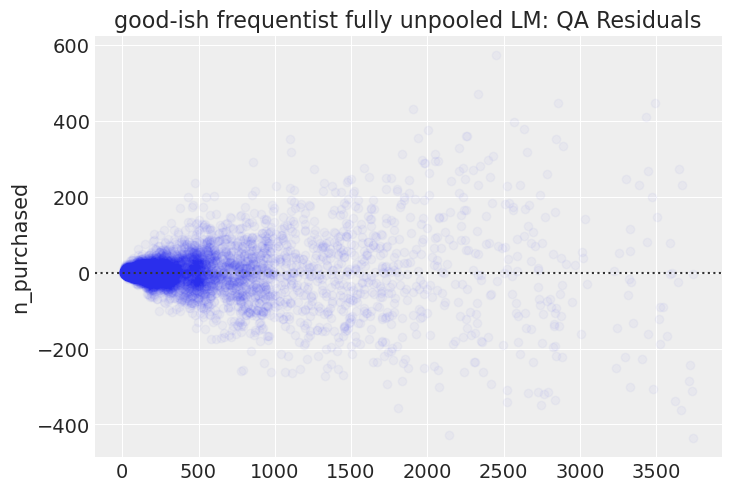

Text(0.5, 0.98, 'good-ish frequentist fully unpooled LM: Normal Q-Q plot of resid., R^2 == 0.73')

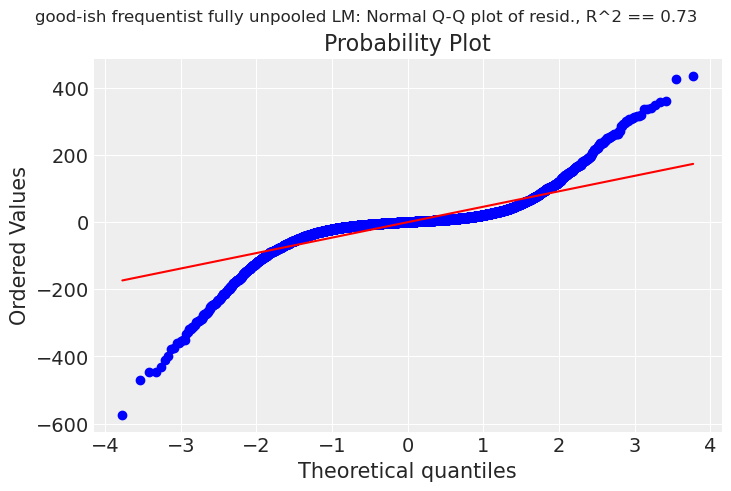

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.0, 'good-ish frequentist fully unpooled LM: Residual distribution')

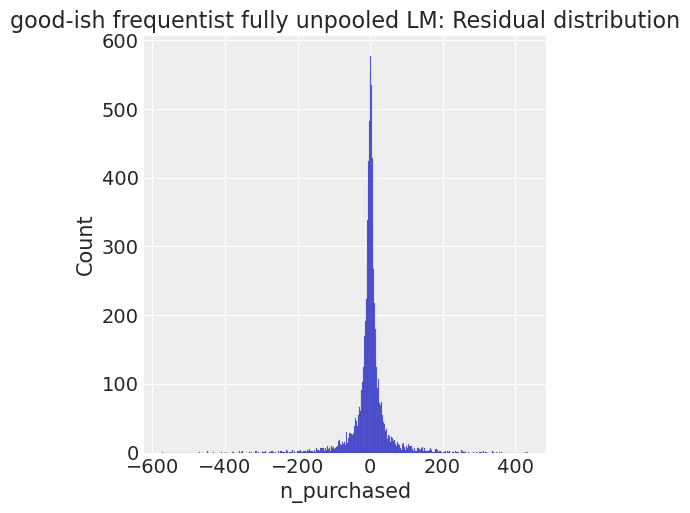

In [129]:
sns.residplot(
    fitted.fittedvalues,
    spends.n_purchased,
    scatter_kws={"alpha": 0.03},
)
plt.title("good-ish frequentist fully unpooled LM: QA Residuals")
plt.show()

fig, ax = plt.subplots()
resids = fitted.fittedvalues - spends.n_purchased
_, (__, ___, r) = sp.stats.probplot(resids, plot=ax, dist="norm", fit=True)
plt.suptitle(
    f"good-ish frequentist fully unpooled LM: Normal Q-Q plot of resid., R^2 == {r**2:.2f}"
)
plt.show()

sns.displot(resids)
plt.title("good-ish frequentist fully unpooled LM: Residual distribution")
plt.show()

Formula: n_purchased ~ google_nonbrand + google_brand + facebook + instagram + direct_mail + youtube + sponsored_content + bing + pinterest + out_of_home + market + price
Family name: Gaussian
Link: identity
Observations: 8567
Priors:
  Common-level effects
    Intercept ~ Flat()
    google_nonbrand ~ Flat()
    google_brand ~ Flat()
    facebook ~ Flat()
    instagram ~ Flat()
    direct_mail ~ Flat()
    youtube ~ Flat()
    sponsored_content ~ Flat()
    bing ~ Flat()
    pinterest ~ Flat()
    out_of_home ~ Flat()
    market ~ Flat()
    price ~ Flat()

  Auxiliary parameters
    sigma ~ HalfStudentT(nu: 4, sigma: 535.0637)


Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (6 chains in 6 jobs)
INFO:pymc3:Multiprocess sampling (6 chains in 6 jobs)
NUTS: [n_purchased_sigma, Intercept, price, market, out_of_home, pinterest, bing, sponsored_content, youtube, direct_mail, instagram, facebook, google_brand, google_nonbrand]
INFO:pymc3:NUTS: [n_purchased_sigma, Intercept, price, market, out_of_home, pinterest, bing, sponsored_content, youtube, direct_mail, instagram, facebook, google_brand, google_nonbrand]


Sampling 6 chains for 1_000 tune and 1_000 draw iterations (6_000 + 6_000 draws total) took 32 seconds.
INFO:pymc3:Sampling 6 chains for 1_000 tune and 1_000 draw iterations (6_000 + 6_000 draws total) took 32 seconds.
The number of effective samples is smaller than 10% for some parameters.


array([[<AxesSubplot:title={'center':'Intercept'}>,
        <AxesSubplot:title={'center':'Intercept'}>],
       [<AxesSubplot:title={'center':'google_nonbrand'}>,
        <AxesSubplot:title={'center':'google_nonbrand'}>],
       [<AxesSubplot:title={'center':'google_brand'}>,
        <AxesSubplot:title={'center':'google_brand'}>],
       [<AxesSubplot:title={'center':'facebook'}>,
        <AxesSubplot:title={'center':'facebook'}>],
       [<AxesSubplot:title={'center':'instagram'}>,
        <AxesSubplot:title={'center':'instagram'}>],
       [<AxesSubplot:title={'center':'direct_mail'}>,
        <AxesSubplot:title={'center':'direct_mail'}>],
       [<AxesSubplot:title={'center':'youtube'}>,
        <AxesSubplot:title={'center':'youtube'}>],
       [<AxesSubplot:title={'center':'sponsored_content'}>,
        <AxesSubplot:title={'center':'sponsored_content'}>],
       [<AxesSubplot:title={'center':'bing'}>,
        <AxesSubplot:title={'center':'bing'}>],
       [<AxesSubplot:title={'cent

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,430.997,12.230,408.662,454.026,0.810,0.574,228.0,457.0,1.02
google_nonbrand,0.401,0.010,0.382,0.421,0.000,0.000,3278.0,4292.0,1.00
google_brand,-0.282,0.044,-0.368,-0.203,0.002,0.001,750.0,2033.0,1.01
facebook,0.202,0.019,0.167,0.238,0.000,0.000,3110.0,3848.0,1.00
instagram,1.636,0.056,1.532,1.744,0.001,0.001,3206.0,3894.0,1.00
...,...,...,...,...,...,...,...,...,...
market[geo_7],-469.018,10.527,-488.603,-449.146,0.542,0.383,379.0,1109.0,1.02
market[geo_8],97.083,6.949,83.456,109.594,0.300,0.212,538.0,1561.0,1.01
market[geo_9],-139.779,8.761,-156.092,-123.204,0.534,0.378,270.0,579.0,1.02
price,-1.988,0.253,-2.480,-1.519,0.005,0.004,2142.0,2719.0,1.00


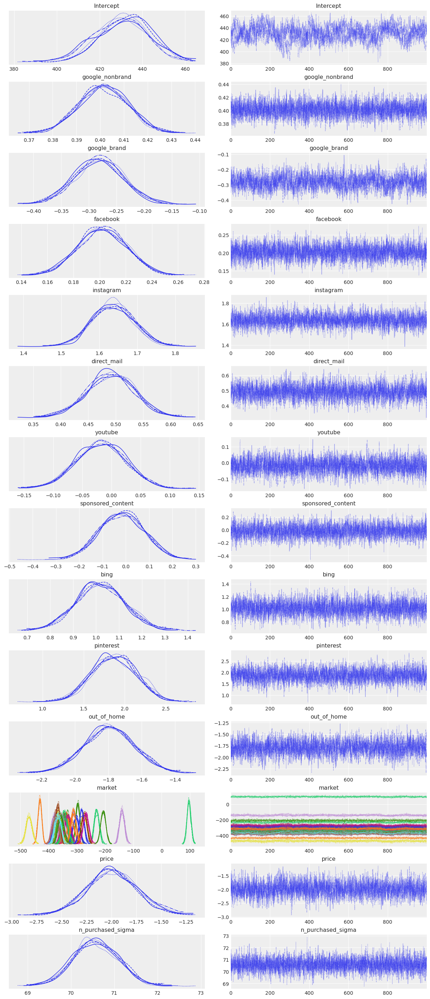

In [127]:
# also fit our frequentist fixed effects w/ PyMC/Bambi so that we can compare it to our Bayesian models later.
TUNE, DRAWS = 1_000, 1_000

# in order to mimic frequentist inference, we'll use a flat prior and ignore Bambi's good defaults.
# we won't be quite identical since frequentist inference relies on the MLE and we'll be using the posterior mean.
# (the latter tends to be slightly more robust/less likely to wildly fail to properly converge);
# but - good enough.
# Warn: model noise seems to have to be non-flat prior, which is fine.

uninformative_prior = bmb.Prior("Flat", auto_scale=False)
priors = {"common": uninformative_prior, "group_specific": uninformative_prior}

model = bmb.Model(
    f"{OUTCOME} ~ {' + '.join(spend_cols + GOOD_CONTROLS)}",
    data=spends,
    priors=priors,
)
model
freq_fe_results = model.fit(
    tune=TUNE,
    draws=DRAWS,
    cores=6,
)  # have 16 cores, might as well use some of them.

# Use ArviZ to plot the results
az.plot_trace(freq_fe_results)

# Key summary and diagnostic info on the model parameters
az.summary(freq_fe_results)

as we'd imagine, ~same as frequentist results fitting with flat priors.

## Bayesian (Linear) Mixed Effects

This is the simple canned version that we can build with Bambi. 

In [131]:
spends.n_purchased.describe()

spends[spend_cols].mean()
spends[spend_cols].sum(axis="columns").mean()

spends[GOOD_CONTROLS].mean()

# on average, spend $2800/market/week and have 1200 purchased
# so we might imagine letting RoAS be within an order of magnitude or so of here.
# say $1 or $10 per marginal purchase seems reasonable, but $0.10 or $100 probably not!

# Likewise, we'll use an only mildly informative intercept that could fully explain our sales,
# say 2500 sales, 3 df t.

count    8567.000000
mean      379.892036
std       535.094978
min         4.415000
25%        74.747000
50%       175.546000
75%       455.297000
max      3939.427000
Name: n_purchased, dtype: float64

google_nonbrand      342.890630
google_brand          53.309398
facebook             183.568143
instagram             63.421102
direct_mail           69.193212
youtube               74.730827
sponsored_content     35.682025
bing                  33.052409
pinterest             13.083396
out_of_home           18.243169
dtype: float64

887.1743095599368

/tmp/ipykernel_9674/3665481642.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  spends[GOOD_CONTROLS].mean()


price    27.537644
dtype: float64

### Drop-in replacement: use Bambi default priors

Formula: n_purchased ~ 0 + market + price + google_nonbrand + google_brand + facebook + instagram + direct_mail + youtube + sponsored_content + bing + pinterest + out_of_home + (google_nonbrand|C(market)) + (google_brand|C(market)) + (facebook|C(market)) + (instagram|C(market)) + (direct_mail|C(market)) + (youtube|C(market)) + (sponsored_content|C(market)) + (bing|C(market)) + (pinterest|C(market)) + (out_of_home|C(market))
Family name: Gaussian
Link: identity
Observations: 8567
Priors:
  Common-level effects
    market ~ Normal(mu: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.], sigma: [ 7841.6459  9377.9779  7886.3955  8968.9662 11068.8173 15299.1508
  8156.0077 11989.5508  9429.9873  8494.3241 11828.5178 10405.421
  8513.3639  8122.7857 15074.2576 10004.3341  9536.7353 10232.3811
  8089.9824  8382.8013  9880.8382  8139.3438  8293.2664  8437.9894
 10232.3811  8590.8723  8815.879

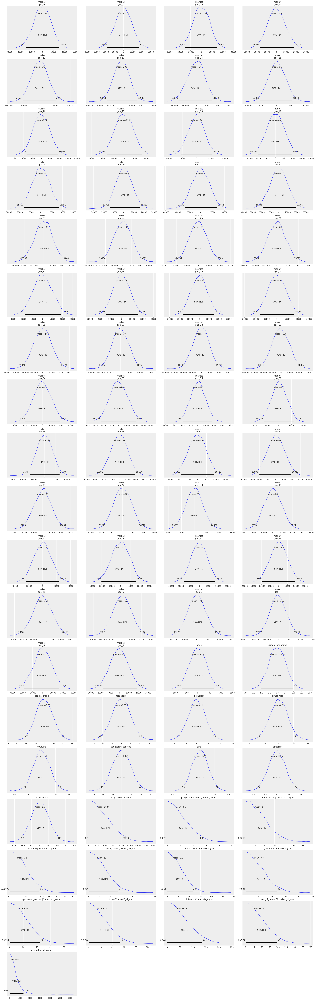

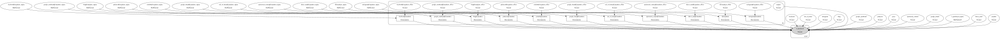

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (6 chains in 6 jobs)
INFO:pymc3:Multiprocess sampling (6 chains in 6 jobs)
NUTS: [n_purchased_sigma, out_of_home|C(market)_offset, out_of_home|C(market)_sigma, pinterest|C(market)_offset, pinterest|C(market)_sigma, bing|C(market)_offset, bing|C(market)_sigma, sponsored_content|C(market)_offset, sponsored_content|C(market)_sigma, youtube|C(market)_offset, youtube|C(market)_sigma, direct_mail|C(market)_offset, direct_mail|C(market)_sigma, instagram|C(market)_offset, instagram|C(market)_sigma, facebook|C(market)_offset, facebook|C(market)_sigma, google_brand|C(market)_offset, google_brand|C(market)_sigma, google_nonbrand|C(market)_offset, google_nonbrand|C(market)_sigma, 1|C(market)_offset, 1|C(market)_sigma, out_of_home, pinterest, bing, sponsored_content, youtube, direct_mail, instagram, facebo

In [ ]:
# naively fit without specifying priors. (note: will use brms-style mildly-informative priors.)
# see bambi docs @ https://bambinos.github.io/bambi/main/notebooks/getting_started.html#Quickstart
# and formulae formula syntax (extends e.g. Patsy) @ https://bambinos.github.io/formulae/

interactions = [f"({c}|C(market))" for c in spend_cols]
bayesian_auto_lr_model = bmb.Model(
    f"{OUTCOME} ~ 0 + {' + '.join(GOOD_CONTROLS + spend_cols + interactions)}",
    data=spends,
    family="gaussian",  # failed w/ Neg. binomial
    #link="identity",  # 'mis-specified'
)
bayesian_auto_lr_model
bayesian_auto_lr_model.build()
_ = bayesian_auto_lr_model.plot_priors()
plt.show()
bayesian_auto_lr_model.graph()

bayesian_auto_lr_results = bayesian_auto_lr_model.fit(
    tune=TUNE,
    draws=DRAWS,
    target_accept=0.95,
    max_treedepth=14,
    cores=6,
)  # have 16 cores, might as well use some of them.

# Use ArviZ to plot the results
az.plot_trace(bayesian_auto_lr_results)

# Key summary and diagnostic info on the model parameters
az.summary(bayesian_auto_lr_results)

# Add posterior predictive to InferenceData + plot
# posterior_predictive = bayesian_auto_lr_model.predict(bayesian_auto_lr_results, kind="pps", draws=500, inplace=True)
# az.plot_ppc(bayesian_auto_lr_results)

Formula: n_purchased ~ 0 + market + price + google_nonbrand + google_brand + facebook + instagram + direct_mail + youtube + sponsored_content + bing + pinterest + out_of_home + (google_nonbrand|C(market)) + (google_brand|C(market)) + (facebook|C(market)) + (instagram|C(market)) + (direct_mail|C(market)) + (youtube|C(market)) + (sponsored_content|C(market)) + (bing|C(market)) + (pinterest|C(market)) + (out_of_home|C(market))
Family name: T
Link: identity
Observations: 8567
Priors:
  Common-level effects
    market ~ StudentT(sd: 0.5, nu: 5)
    price ~ StudentT(sd: 0.5, nu: 5)
    google_nonbrand ~ StudentT(sd: 0.5, nu: 5)
    google_brand ~ StudentT(sd: 0.5, nu: 5)
    facebook ~ StudentT(sd: 0.5, nu: 5)
    instagram ~ StudentT(sd: 0.5, nu: 5)
    direct_mail ~ StudentT(sd: 0.5, nu: 5)
    youtube ~ StudentT(sd: 0.5, nu: 5)
    sponsored_content ~ StudentT(sd: 0.5, nu: 5)
    bing ~ StudentT(sd: 0.5, nu: 5)
    pinterest ~ StudentT(sd: 0.5, nu: 5)
    out_of_home ~ StudentT(sd: 0.5, n

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (63) in plot_posterior, generating only 40 plots
  warnings.warn(


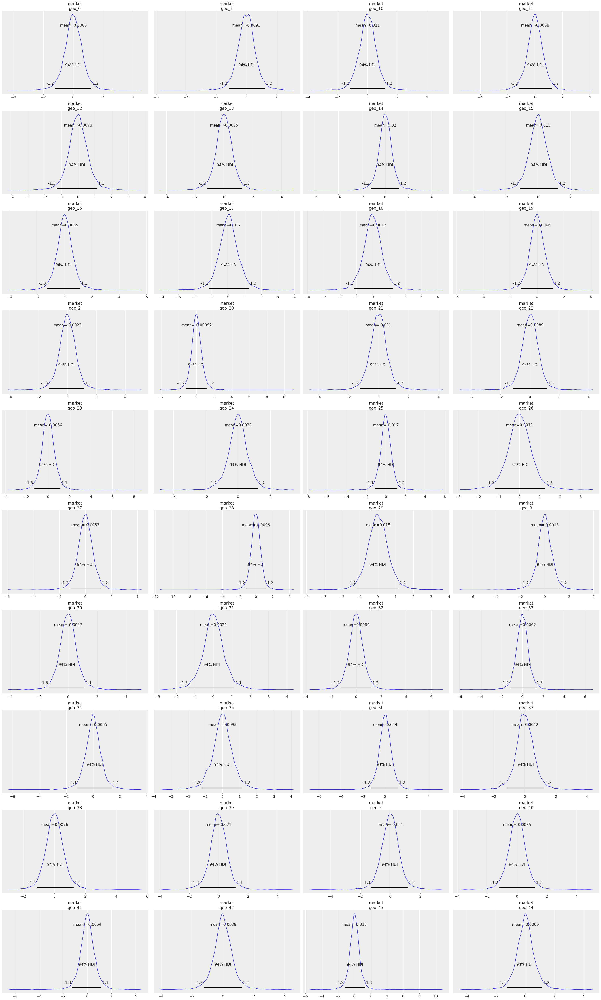

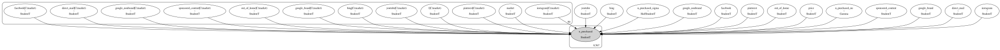

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (6 chains in 6 jobs)
INFO:pymc3:Multiprocess sampling (6 chains in 6 jobs)
NUTS: [n_purchased_nu, n_purchased_sigma, out_of_home|C(market), pinterest|C(market), bing|C(market), sponsored_content|C(market), youtube|C(market), direct_mail|C(market), instagram|C(market), facebook|C(market), google_brand|C(market), google_nonbrand|C(market), 1|C(market), out_of_home, pinterest, bing, sponsored_content, youtube, direct_mail, instagram, facebook, google_brand, google_nonbrand, price, market]
INFO:pymc3:NUTS: [n_purchased_nu, n_purchased_sigma, out_of_home|C(market), pinterest|C(market), bing|C(market), sponsored_content|C(market), youtube|C(market), direct_mail|C(market), instagram|C(market), facebook|C(market), google_brand|C(market), google_nonbrand|C(market), 1|C(market), out_of_home, pinterest, 

Sampling 6 chains for 1_000 tune and 1_000 draw iterations (6_000 + 6_000 draws total) took 2091 seconds.
INFO:pymc3:Sampling 6 chains for 1_000 tune and 1_000 draw iterations (6_000 + 6_000 draws total) took 2091 seconds.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The estimated number of effective samples is smaller than 200 for some parameters.
ERROR:pymc3:The estimated number of effective 

array([[<AxesSubplot:title={'center':'market'}>,
        <AxesSubplot:title={'center':'market'}>],
       [<AxesSubplot:title={'center':'price'}>,
        <AxesSubplot:title={'center':'price'}>],
       [<AxesSubplot:title={'center':'google_nonbrand'}>,
        <AxesSubplot:title={'center':'google_nonbrand'}>],
       [<AxesSubplot:title={'center':'google_brand'}>,
        <AxesSubplot:title={'center':'google_brand'}>],
       [<AxesSubplot:title={'center':'facebook'}>,
        <AxesSubplot:title={'center':'facebook'}>],
       [<AxesSubplot:title={'center':'instagram'}>,
        <AxesSubplot:title={'center':'instagram'}>],
       [<AxesSubplot:title={'center':'direct_mail'}>,
        <AxesSubplot:title={'center':'direct_mail'}>],
       [<AxesSubplot:title={'center':'youtube'}>,
        <AxesSubplot:title={'center':'youtube'}>],
       [<AxesSubplot:title={'center':'sponsored_content'}>,
        <AxesSubplot:title={'center':'sponsored_content'}>],
       [<AxesSubplot:title={'center':

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
market[geo_0],1.178,0.421,0.338,1.906,0.013,0.009,1097.0,1183.0,1.01
market[geo_1],0.827,0.355,0.144,1.453,0.011,0.008,1155.0,1151.0,1.00
market[geo_10],0.884,0.374,0.095,1.500,0.010,0.007,1329.0,1714.0,1.00
market[geo_11],1.074,0.389,0.346,1.798,0.011,0.008,1394.0,1433.0,1.00
market[geo_12],0.705,0.403,-0.102,1.439,0.011,0.008,1356.0,1973.0,1.00
...,...,...,...,...,...,...,...,...,...
out_of_home|C(market)[geo_7],0.016,0.087,-0.142,0.181,0.003,0.002,1079.0,2419.0,1.01
out_of_home|C(market)[geo_8],-0.007,0.059,-0.115,0.107,0.003,0.002,432.0,1143.0,1.02
out_of_home|C(market)[geo_9],0.117,0.061,0.003,0.234,0.003,0.002,481.0,1657.0,1.01
n_purchased_sigma,0.097,0.001,0.095,0.100,0.000,0.000,1696.0,3030.0,1.00


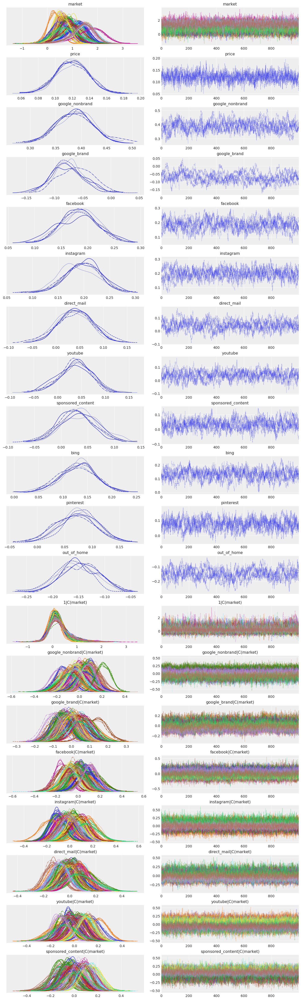

In [108]:
# # # log-log?

# logged = spends.copy()
# num_cols = logged.select_dtypes(include=[np.number]).columns
# logged[num_cols] = np.log(1 + logged[num_cols])

# interactions = [f"({c}|C(market))" for c in spend_cols]
# priors = dict()
# priors["group_specific"] = bmb.Prior("HalfStudentT", sd=0.10, nu=5)
# priors["common"] = bmb.Prior("StudentT", sd=0.33, nu=5)

# priors["price"] = bmb.Prior("StudentT", sd=0.5, nu=5)
# #priors["nu"] = bmb.Prior("HalfStudentT", sd=20, nu=3)
# #priors["sigma"] = bmb.Prior("HalfStudentT", sd=spends.n_purchased.std() / 2, nu=5) 

# bayesian_auto_loglog_model = bmb.Model(
#     f"{OUTCOME} ~ 0 + {' + '.join(GOOD_CONTROLS + spend_cols + interactions)}",
#     data=logged,
#     priors=priors,
#     family="negativebinomial",
# )
# bayesian_auto_loglog_model
# bayesian_auto_loglog_model.build()
# _ = bayesian_auto_loglog_model.plot_priors()
# plt.show()
# bayesian_auto_loglog_model.graph()

# bayesian_auto_loglog_results = bayesian_auto_loglog_model.fit(
#     tune=TUNE,
#     draws=DRAWS,
#     target_accept=0.95,
#     max_treedepth=14,
#     cores=6,
# )  # have 16 cores, might as well use some of them.

# # Use ArviZ to plot the results
# az.plot_trace(bayesian_auto_loglog_results)

# # Key summary and diagnostic info on the model parameters
# az.summary(bayesian_auto_loglog_results)

note the _positive_ coeff on price (obviously wrong) and the nonstationary trace.  

sampling ran into lots of problems, since priors carried very little information.  

still, the parameter estimates look a lot better than from our frequentist model, due to the ability to model market-level differences in slope.

{'google_nonbrand': HalfStudentT(sd: 0.5, nu: 5),
 'google_brand': HalfStudentT(sd: 0.5, nu: 5),
 'facebook': HalfStudentT(sd: 0.5, nu: 5),
 'instagram': HalfStudentT(sd: 0.5, nu: 5),
 'direct_mail': HalfStudentT(sd: 0.5, nu: 5),
 'youtube': HalfStudentT(sd: 0.5, nu: 5),
 'sponsored_content': HalfStudentT(sd: 0.5, nu: 5),
 'bing': HalfStudentT(sd: 0.5, nu: 5),
 'pinterest': HalfStudentT(sd: 0.5, nu: 5),
 'out_of_home': HalfStudentT(sd: 0.5, nu: 5),
 '(google_nonbrand|C(market))': StudentT(sd: 0.2, nu: 5),
 '(google_brand|C(market))': StudentT(sd: 0.2, nu: 5),
 '(facebook|C(market))': StudentT(sd: 0.2, nu: 5),
 '(instagram|C(market))': StudentT(sd: 0.2, nu: 5),
 '(direct_mail|C(market))': StudentT(sd: 0.2, nu: 5),
 '(youtube|C(market))': StudentT(sd: 0.2, nu: 5),
 '(sponsored_content|C(market))': StudentT(sd: 0.2, nu: 5),
 '(bing|C(market))': StudentT(sd: 0.2, nu: 5),
 '(pinterest|C(market))': StudentT(sd: 0.2, nu: 5),
 '(out_of_home|C(market))': StudentT(sd: 0.2, nu: 5),
 'market': Hal

Formula: n_purchased ~ 0 + market + price + google_nonbrand + google_brand + facebook + instagram + direct_mail + youtube + sponsored_content + bing + pinterest + out_of_home + (google_nonbrand|C(market)) + (google_brand|C(market)) + (facebook|C(market)) + (instagram|C(market)) + (direct_mail|C(market)) + (youtube|C(market)) + (sponsored_content|C(market)) + (bing|C(market)) + (pinterest|C(market)) + (out_of_home|C(market))
Family name: Negativebinomial
Link: identity
Observations: 8567
Priors:
  Common-level effects
    market ~ HalfStudentT(sd: 6.2824, nu: 3)
    price ~ StudentT(sd: 0.5, nu: 3)
    google_nonbrand ~ HalfStudentT(sd: 0.5, nu: 5)
    google_brand ~ HalfStudentT(sd: 0.5, nu: 5)
    facebook ~ HalfStudentT(sd: 0.5, nu: 5)
    instagram ~ HalfStudentT(sd: 0.5, nu: 5)
    direct_mail ~ HalfStudentT(sd: 0.5, nu: 5)
    youtube ~ HalfStudentT(sd: 0.5, nu: 5)
    sponsored_content ~ HalfStudentT(sd: 0.5, nu: 5)
    bing ~ HalfStudentT(sd: 0.5, nu: 5)
    pinterest ~ HalfStud

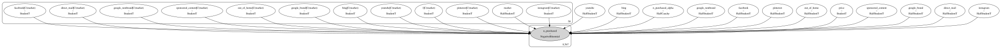

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (6 chains in 6 jobs)
INFO:pymc3:Multiprocess sampling (6 chains in 6 jobs)
NUTS: [n_purchased_alpha, out_of_home|C(market), pinterest|C(market), bing|C(market), sponsored_content|C(market), youtube|C(market), direct_mail|C(market), instagram|C(market), facebook|C(market), google_brand|C(market), google_nonbrand|C(market), 1|C(market), out_of_home, pinterest, bing, sponsored_content, youtube, direct_mail, instagram, facebook, google_brand, google_nonbrand, price, market]
INFO:pymc3:NUTS: [n_purchased_alpha, out_of_home|C(market), pinterest|C(market), bing|C(market), sponsored_content|C(market), youtube|C(market), direct_mail|C(market), instagram|C(market), facebook|C(market), google_brand|C(market), google_nonbrand|C(market), 1|C(market), out_of_home, pinterest, bing, sponsored_content, youtube

Sampling 6 chains for 1_000 tune and 1_000 draw iterations (6_000 + 6_000 draws total) took 671 seconds.
INFO:pymc3:Sampling 6 chains for 1_000 tune and 1_000 draw iterations (6_000 + 6_000 draws total) took 671 seconds.
The number of effective samples is smaller than 25% for some parameters.
INFO:pymc3:The number of effective samples is smaller than 25% for some parameters.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
price,0.029,0.024,-0.017,0.073,0.001,0.000,2060.0,3622.0,1.0
1|C(market)[geo_0],0.005,0.329,-0.581,0.640,0.003,0.006,10977.0,2816.0,1.0
1|C(market)[geo_1],0.015,0.326,-0.568,0.617,0.004,0.006,11034.0,3361.0,1.0
1|C(market)[geo_10],0.016,0.316,-0.569,0.635,0.003,0.006,10805.0,2823.0,1.0
1|C(market)[geo_11],0.002,0.316,-0.614,0.589,0.003,0.005,10530.0,2863.0,1.0
...,...,...,...,...,...,...,...,...,...
sponsored_content,0.263,0.117,0.040,0.477,0.002,0.001,2483.0,977.0,1.0
bing,1.351,0.125,1.123,1.592,0.001,0.001,7380.0,4782.0,1.0
pinterest,0.574,0.252,0.116,1.051,0.003,0.002,6085.0,3039.0,1.0
out_of_home,0.013,0.013,0.000,0.038,0.000,0.000,6984.0,2747.0,1.0


<AxesSubplot:xlabel='n_purchased / n_purchased'>

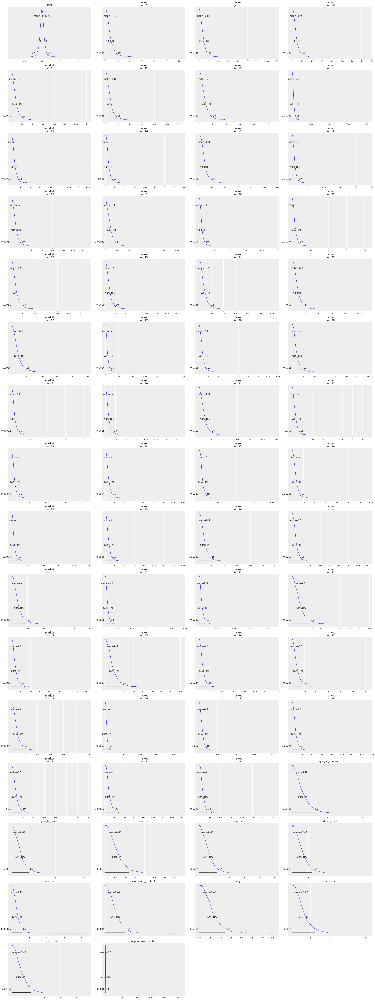

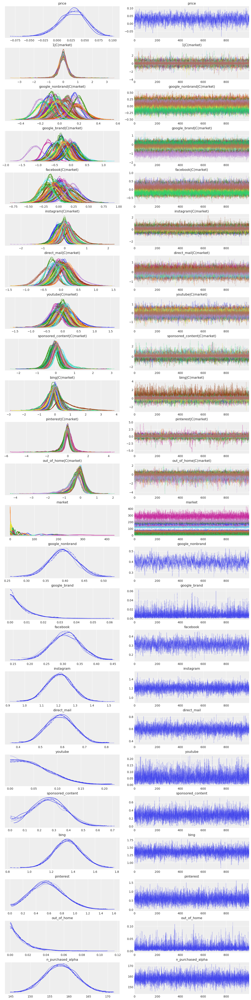

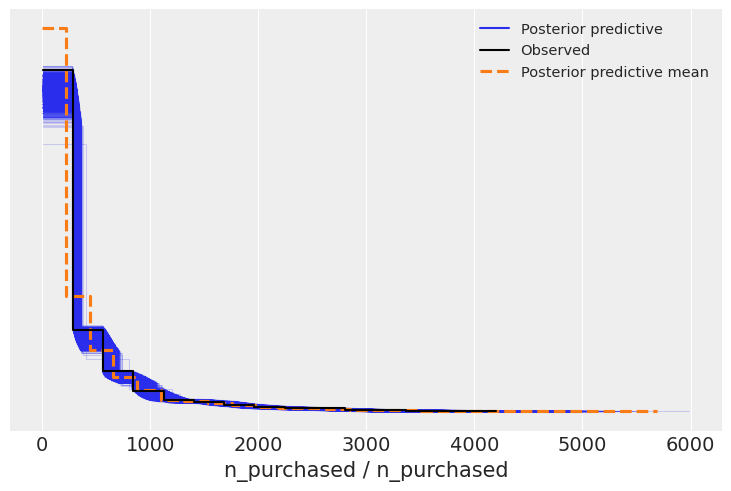

In [147]:
# Tweaked bayesian LR

market_intercept_prior = bmb.Prior(
    "HalfStudentT", sd=np.log(spends.n_purchased.std()), nu=3
)
spend_prior = bmb.Prior("HalfStudentT", sd=0.5, nu=5)
priors = {c: spend_prior for c in spend_cols}

interactions = [f"({c}|C(market))" for c in spend_cols]
interaction_prior = bmb.Prior("StudentT", sd=0.2, nu=5)
interaction_priors = {c: interaction_prior for c in interactions}
priors.update(interaction_priors)

priors["market"] = market_intercept_prior
# Unfortunately, I don't think we can easily do negative-constrained priors in Bambi, so use two-tailed.
# Of course, our price effect isn't simply additive, either.
priors["price"] = bmb.Prior("StudentT", sd=0.5, nu=3)
priors["group_specific"] = bmb.Prior("StudentT", sd=0.25, nu=5)
priors["common"] = bmb.Prior("StudentT", sd=0.5, nu=5)
# priors["nu"] = bmb.Prior("HalfStudentT", sd=20, nu=3)
# priors["sigma"] = bmb.Prior("HalfStudentT", sd=spends.n_purchased.std() / 2, nu=5)
priors

# note `0 +` - put all of intercept in market-intercept, zero in pooled intercept.
# otherwise we'll have very correlated params, which makes sampling hard.
# f"{OUTCOME} ~ 0 + {' + '.join(spend_cols + GOOD_CONTROLS)} + market|{' + market|'.join(spend_cols)}"
# spends.market = spends.market.astype("str")
# "n_purchased ~ 0 + C(market) + google_nonbrand + (0 + C(market):google_nonbrand)"
bayesian_lr_model = bmb.Model(
    f"{OUTCOME} ~ 0 + {' + '.join(GOOD_CONTROLS + spend_cols + interactions)}",
    data=spends,
    priors=priors,
    family="negativebinomial",
    link="identity",  # 'mis-specified'
)
bayesian_lr_model
bayesian_lr_model.build()
_ = bayesian_lr_model.plot_priors()
bayesian_lr_model.graph()

bayesian_lr_results = bayesian_lr_model.fit(
    tune=TUNE,
    draws=DRAWS,
    cores=6,
    target_accept=0.95,
    max_treedepth=14,
)  # have 16 cores, might as well use some of them.

# Use ArviZ to plot the results
_ = az.plot_trace(bayesian_lr_results)

# Key summary and diagnostic info on the model parameters
az.summary(bayesian_lr_results)

# Add posterior predictive to InferenceData + plot
posterior_predictive = bayesian_lr_model.predict(
    bayesian_lr_results, kind="pps", draws=500
)
az.plot_ppc(bayesian_lr_results)

not perfect, but much better.  

posterior predictive looks quite good except for predicting negative values.  

__warn: required syntax for mixed effects is `feature|group` NOT `group|feature`.__

In [148]:
import gc

gc.collect()

186070

In [16]:
# # validate
# import statsmodels.formula.api as smf

# mod = smf.ols("y ~ f0 + f1 + f2 + f3 + f4 + group_i + f0:group_i", data=xys)
# mod.fit().summary()

In [14]:
# # expected behavior: mixed effects
# import bambi as bmb

# debug_model = bmb.Model(
#     "y ~ f0 + f1 + f2 + f3 + f4 + (f0|group_i)",
#     data=xys,
# )
# debug_model
# debug_model.build()
# debug_model.graph()
# res = debug_model.fit()

In [15]:
# # unintuitive behavior: one group per observation!
# debug_model = bmb.Model(
#     "y ~ f0 + f1 + f2 + f3 + f4 + (group_i|f0)",
#     data=xys,
# )
# debug_model
# debug_model.build()
# debug_model.graph()
# # res = debug_model.fit()

## Manually-specified PyMC3 Models  

We'll add a multiplicative price effect and hopefully random walks on coeffs.  

__TODO__:
- validate it didn't explode ;)  
- half-sat. parametrization from HelloFresh (see: https://www.pymc-labs.io/blog-posts/reducing-customer-acquisition-costs-how-we-helped-optimizing-hellofreshs-marketing-budget/https://www.pymc-labs.io/blog-posts/reducing-customer-acquisition-costs-how-we-helped-optimizing-hellofreshs-marketing-budget/)  
- better outcome parametrization? - log-log might be ok? gamma is janky but forces positive. neg-binomial typically has log(coeff). t or normal -> negative
- random walk coeffs  

In [97]:
import copy
import warnings


def assess_mc3(
    inferencedata: az.data.inference_data.InferenceData,
    model: pm.model.Model,
    trace_vars: [str] = None,
    forest_vars: [str] = None,
    ppc_vars: [str] = None,
    plot_forest: bool = True,
    model_name: str = "",
    raise_rhat: bool = True,
):
    if not isinstance(inferencedata, az.data.inference_data.InferenceData):
        raise (
            ValueError(
                "Param `inferencedata` requires Arviz inferencedata, not legacy PyMC3 trace."
            )
        )
    if not isinstance(model, pm.model.Model):
        raise (ValueError("Param `model` requires PyMC3 pm.model.Model."))

    inferencedata = copy.deepcopy(inferencedata)

    with custom_pymc3_model:
        ppc = az.from_dict(
            posterior_predictive=pm.fast_sample_posterior_predictive(
                inferencedata,
                # samples=1_000, # PyMC3 will complain if not all
                random_seed=42,
                keep_size=True,
            )
        )
        inferencedata.extend(ppc)  # inplace operation

    summary = az.summary(inferencedata)

    try:
        # 1.1 is a very loose standard for r_hat; even 1.01 is not great.
        assert (summary.r_hat < 1.1).all()

    except AssertionError as err:
        print(summary)
        print("Raising, r_hat > 1.1 for one or more parameters.")
        if raise_rhat:
            raise (err)

    all_rhat_lt_1_01 = (summary.r_hat < 1.01).all()
    if not all_rhat_lt_1_01:
        warnings.warn("Some r-hat greater than 1.01, may have poor convergence.")

    az.plot_trace(
        inferencedata,
        var_names=trace_vars,
        show=False,
    )
    plt.suptitle(f"{model_name} traces (posterior probability density dist.)")
    plt.show()

    if plot_forest:  # can get messy for complex models
        az.plot_forest(
            inferencedata,
            var_names=forest_vars,  # plot all if None
            show=False,
        )
        plt.suptitle(f"{model_name} 94% Posterior Density (Bayesian 'CI')")
        plt.show()

    az.plot_ppc(
        inferencedata,
        alpha=0.10,
        kind="kde",
        var_names=ppc_vars,
        num_pp_samples=300,
        random_seed=42,
        figsize=(8, 6),
        show=False,
    )
    plt.title(f"{model_name}: posterior predictive fit")
    plt.show()

    return summary

In [11]:
def plot_priors(model: pm.model.Model, n: int = 5_000, seed=42):

    with model:
        prior_checks = pm.sample_prior_predictive(samples=n, random_seed=seed)

    COLS = 3
    rows = (len(prior_checks.items()) // COLS) + 1
    fig, axs = plt.subplots(
        rows,
        COLS,
        figsize=(10, rows * 3),
        sharex=False,
    )

    for i, (param, values) in enumerate(prior_checks.items()):
        values = pd.Series(values.ravel()).sample(n)
        # ignore extreme 1% of tails for ease of visualization
        lo, hi = values.quantile(0.005), values.quantile(0.995)
        values = values.loc[values.between(lo, hi)]
        ax = axs[i // COLS, i % COLS]
        _ = sns.histplot(
            values,
            kde=True,
            ax=ax,
        )
        _ = ax.set_title(f"{param}")

    _ = plt.suptitle("Prior Predictive Checks")
    plt.show()

In [135]:
# debug
# temp = spends.loc[spends.market_idx < 5].copy()

n_mkts, n_channels = spends.market.nunique(), len(spend_cols)
confound_cols = [c for c in GOOD_CONTROLS if "market" not in c]
n_confounds = len(confound_cols)

with pm.Model() as custom_pymc3_model:

    # I'm intentionally NOT pooling market-level intercepts.
    # Since some markets might be 10x the size of another, there's
    #   not really anything to gain from pooling.
    # HOWEVER, one idea would be to model intercept as pop_size_in_mkt * param,
    #   in other words assuming organic demand scales with a city's population.
    # And in that alternate formulation, a global intercept with offsets could make sense!
    intercept = pm.HalfStudentT(
        "geo_demand_wo_ads",
        sd=spends.n_purchased.std(),
        nu=3,
        shape=n_mkts,
        testval=100.0,
    )

    # Betas (RoAS)
    pool_b = pm.HalfStudentT(
        f"pooled_beta", sigma=1, nu=5, shape=(n_channels, 1), testval=0.25
    )
    grp_offset = pm.StudentT(
        f"geo_beta_offset",
        mu=0,
        sd=0.25,
        nu=5,
        shape=(n_channels, n_mkts),
        testval=0.01,
    )
    # Shared scale param b/w mkts for each channel
    slope_unpool_scale = pm.HalfNormal(
        f"slope_unpool_scale", sd=1.0, shape=(n_channels, 1), testval=0.5
    )

    # After partial pooling
    beta = pm.Deterministic(
        "marginal_return_on_1_USD",
        pool_b + grp_offset * slope_unpool_scale,
    )

    # Confounds - pooled fully b/w markets (not ideal).
    # confound_beta = pm.StudentT(
    #     "beta_for_confounds",
    #     mu=0,
    #     sd=1,
    #     nu=4,
    #     shape=(n_confounds, 1),
    #     testval=0,
    # )

    # Price elasticity is dy/dx (% change y / % change x).
    #   (again, I'm not an economist ;)
    price_elasticity = pm.HalfNormal(
        "price_elasticity",
        sd=0.5,
        testval=0.25,
    )
    # in model, we want 1 + elasticity.
    # (at min, no effect of price drop; never negative / not a giffen good)
    # i.e. for 10% elasticity, we'd get 1.1x purchases
    # elasticity_multiple = pm.Deterministic("elasticity_multiple", 1 + price_elasticity)

    # model error
    # sigma = pm.HalfStudentT(
    #    "sigma",
    #    sd=spends.n_purchased.std(),
    #    nu=3,
    #    testval=spends.n_purchased.std() / 10,
    # )
    # shape/dispersion for T
    # nu = pm.HalfCauchy("t_df", 10, testval=5)
    # shape/dispersion for Neg. Binomial
    base_alpha = pm.HalfStudentT(
        "base_for_alpha", sd=spends.n_purchased.std() / 2, nu=5, testval=10
    )
    alpha = pm.Deterministic("nbin_dispersion", base_alpha + 0.001)

    # Create theano shared tensors to allow for out-of-sample predictions.
    ad_spends = pm.Data("spends", spends[spend_cols])
    # confounds = pm.Data("confounds", spends[confound_cols])
    prices_rel_max = pm.Data("prices_rel_max", spends.price.max() / spends["price"])
    mkts = pm.Data("markets", spends["market_idx"])
    obs = pm.Data(f"{OUTCOME}_obs", spends[OUTCOME])

    # TODO: shift to linear algebra formulation; otherwise a bit gross.

    # WiP, getting yuge 5k x n_obs x n_obs tensor, should be 50 x n_obs
    # mu = (
    #     intercept[mkts]
    #     + pm.math.dot(ad_spends, beta[:, mkts])
    #     + pm.math.dot(confounds, confound_beta)
    # )

    mu = intercept[mkts]
    for i in range(n_channels):
        # mu += beta[i, mkts] * ad_spends[:, i] * elasticity_multiple * prices_rel_max
        # above doesn't work I think. below: main effect plus price interaction. no main effect of price.
        mu += (
            beta[i, mkts] * ad_spends[:, i]
            + beta[i, mkts] * ad_spends[:, i] * price_elasticity * prices_rel_max
        )

    # for i in range(n_confounds):
    #     mu += confound_beta[i] * confounds[:, i]

    # Not sure of best likelihood to use. I'm thinking of:
    # - OLS/t but on e.g. log scale (but % interpretation doesn't really make sense)
    # - gamma (forces positive but hard to justify mathematically)
    # - neg. binomial - frequently used for count data, but I don't like exp() here
    # - discrete weibull? idk.
    y_obs = pm.NegativeBinomial(
        OUTCOME,
        mu=mu,
        alpha=alpha,
        # sigma=sigma,
        # nu=nu,
        observed=obs,
    )

# check priors before sampling
# plot_priors(custom_pymc3_model)

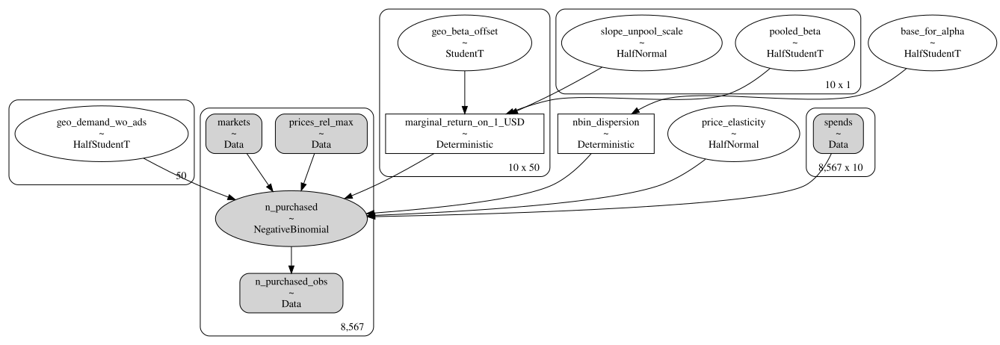

In [136]:
# custom_pymc3_model.build()
# custom_pymc3_model.graph()
pm.model_graph.model_to_graphviz(model=custom_pymc3_model)

In [137]:
with custom_pymc3_model:
    bayesian_custom_model_results = pm.sample(
        draws=DRAWS,
        tune=TUNE,
        cores=6,
        random_seed=SEED,
        target_accept=0.95,
        max_treedepth=14,
        return_inferencedata=True,
    )

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (6 chains in 6 jobs)
INFO:pymc3:Multiprocess sampling (6 chains in 6 jobs)
NUTS: [base_for_alpha, price_elasticity, slope_unpool_scale, geo_beta_offset, pooled_beta, geo_demand_wo_ads]
INFO:pymc3:NUTS: [base_for_alpha, price_elasticity, slope_unpool_scale, geo_beta_offset, pooled_beta, geo_demand_wo_ads]


Sampling 6 chains for 1_000 tune and 1_000 draw iterations (6_000 + 6_000 draws total) took 4401 seconds.
INFO:pymc3:Sampling 6 chains for 1_000 tune and 1_000 draw iterations (6_000 + 6_000 draws total) took 4401 seconds.
The number of effective samples is smaller than 25% for some parameters.
INFO:pymc3:The number of effective samples is smaller than 25% for some parameters.


/tmp/ipykernel_13754/3039483701.py:51: UserWarning: Some r-hat greater than 1.01, may have poor convergence.
  warnings.warn("Some r-hat greater than 1.01, may have poor convergence.")


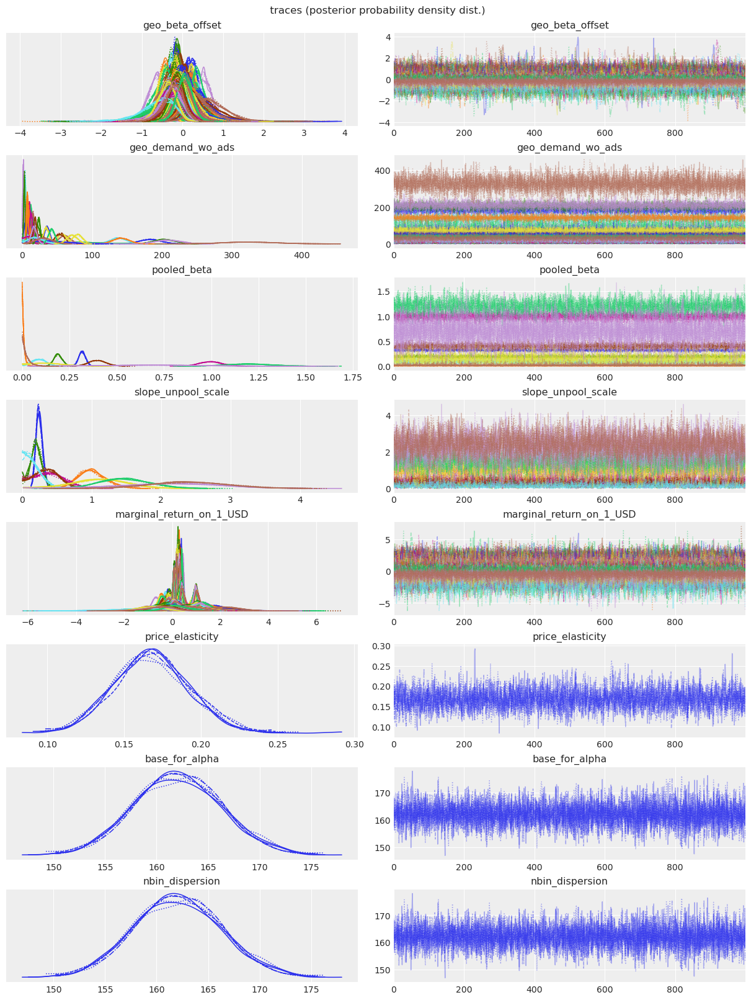

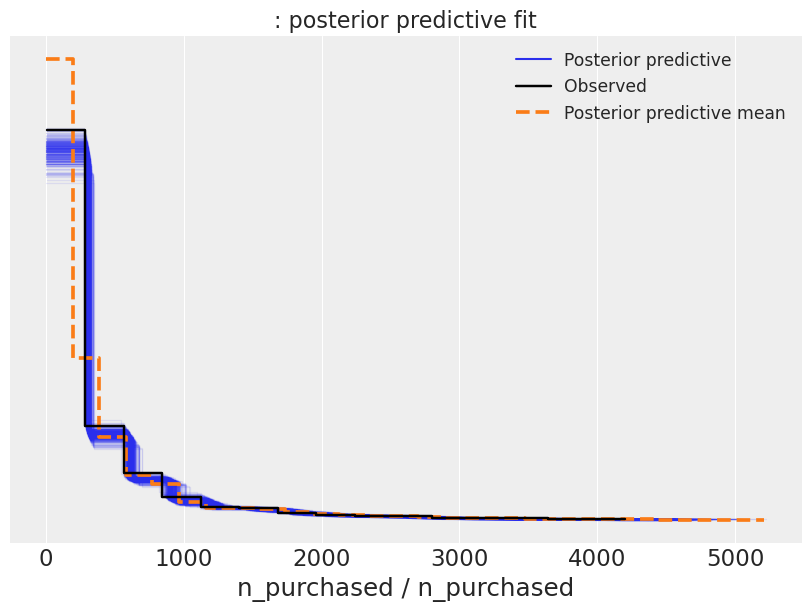

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"geo_beta_offset[0, 0]",0.284,0.146,0.008,0.550,0.002,0.002,5161.0,3449.0,1.0
"geo_beta_offset[0, 1]",-0.117,0.184,-0.486,0.216,0.002,0.002,6459.0,3716.0,1.0
"geo_beta_offset[0, 2]",-0.293,0.130,-0.539,-0.058,0.002,0.001,4779.0,4192.0,1.0
"geo_beta_offset[0, 3]",0.235,0.204,-0.134,0.625,0.002,0.002,7777.0,4448.0,1.0
"geo_beta_offset[0, 4]",0.141,0.167,-0.192,0.446,0.002,0.002,7849.0,4345.0,1.0
...,...,...,...,...,...,...,...,...,...
"marginal_return_on_1_USD[9, 48]",-0.674,0.625,-1.908,0.397,0.009,0.007,5137.0,4437.0,1.0
"marginal_return_on_1_USD[9, 49]",-0.518,0.619,-1.726,0.595,0.007,0.007,7601.0,4482.0,1.0
price_elasticity,0.168,0.025,0.123,0.215,0.000,0.000,3063.0,4256.0,1.0
base_for_alpha,162.089,4.270,154.107,170.153,0.042,0.029,10470.0,4687.0,1.0


In [140]:
assess_mc3(
    bayesian_custom_model_results,
    custom_pymc3_model,
    raise_rhat=False,
    plot_forest=False,
)

In [ ]:
# with pm.Model() as temp_model:
#     ad_spends = pm.Data("spends", spends[spend_cols])
#     confounds = pm.Data(
#         "confounds", spends[[c for c in GOOD_CONTROLS if "market" not in c]]
#     )
#     mkts = pm.Data("markets", spends["market_idx"])
#     obs = pm.Data(f"{OUTCOME}_obs", spends[OUTCOME])

In [59]:
# pm.math.concatenate([ad_spends, confounds])

# import theano.tensor as tt

# tt.printing.Print("ad_spends")(ad_spends.shape)
# tt.printing.Print("beta")(beta.shape)
# spends[spend_cols]
# ad_spends[:, :], beta[:, mkts]
# pm.math.dot(ad_spends[:, mkts], beta)

# i

In [60]:
# np.dot(spends[spend_cols], spends[spend_cols].iloc[0])  # .shape

## Model Comparison  

We'd often include a true dummy model (i.e. predict mean for all x), but I've omitted to make our comparison more readable.  

In [149]:
df_comp_loo = az.compare(
    {
        "freq_FE": freq_fe_results,
        "bayes_mixed_auto": bayesian_auto_lr_results,
        "bayes_mixed_manual": bayesian_lr_results,
        "bayes_custom": bayesian_custom_model_results,
        # todo custom model
    },
    ic="loo",
    method="stacking",
)
df_comp_loo

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/arviz/stats/stats.py:694: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/arviz/stats/stats.py:694: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


,rank,loo,p_loo,d_loo,weight,se,dse,warning,loo_scale
bayes_custom,0,-38123.755304,226.344112,0.000000,0.980127,118.635897,0.000000,False,log
bayes_mixed_manual,1,-38200.158729,242.437946,76.403425,0.017789,118.741345,12.537305,False,log
bayes_mixed_auto,2,-41796.030573,1283.733440,3672.275269,0.000000,152.305696,79.209552,True,log
freq_FE,3,-48694.018930,139.496066,10570.263626,0.002085,206.179989,188.173259,True,log


<AxesSubplot:xlabel='Log'>

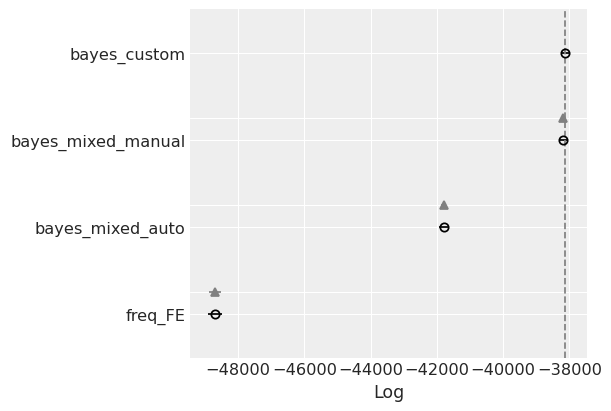

In [150]:
az.plot_compare(df_comp_loo, insample_dev=False)

In [ ]:
# 11/28 pm manual:
# -38723.428957	203.132244	0.000000	9.428840e-01	120.287807

In [134]:
# ref!

az.compare(
    {
        "freq_FE": freq_fe_results,
        "bayes_mixed_auto": bayesian_auto_lr_results,
        "bayes_mixed_manual": bayesian_lr_results,
        "bayes_custom": bayesian_custom_model_results,
        # todo custom model
    },
    ic="loo",
    method="stacking",
)

/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/arviz/stats/stats.py:694: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/home/jan/miniconda3/envs/2021-11/lib/python3.9/site-packages/arviz/stats/stats.py:694: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/home/jan/miniconda3/envs/2021-11/lib/python

,rank,loo,p_loo,d_loo,weight,se,dse,warning,loo_scale
bayes_custom,0,-38723.428957,203.132244,0.000000,9.428840e-01,120.287807,0.000000,False,log
bayes_mixed_auto,1,-41796.030573,1283.733440,3072.601616,5.711603e-02,152.305696,89.062763,True,log
bayes_mixed_manual,2,-41880.237467,1343.991066,3156.808510,5.661907e-16,152.132207,89.037173,True,log
freq_FE,3,-48694.018930,139.496066,9970.589973,0.000000e+00,206.179989,191.902728,True,log
